In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
tej = pd.read_csv('tej.csv')
tcri = pd.read_csv('tcri.csv')

In [2]:
tej

,公司,年/月,季別,合併(Y/N),月份,幣別,現金及約當現金,流動資產,資產總額,流動負債,...,淨值/資產,長期資金適合率(A),長短期借款,淨負債,借款依存度,或有負債/淨值,營業利益 /實收資本比,稅前純益 /實收資本,內部保留比率,股利支付率
0,1101 台泥,2024/12,4,Y,12,NTD,"77,764,504","173,380,580","593,413,647","86,373,382",...,51.89,218.12,"197,191,220","86,938,867",64.04,0,22.1,29.46,29.51,66.89
1,1101 台泥,2020/06,2,Y,6,NTD,"59,005,748","125,133,183","384,500,092","85,597,499",...,51.10,319.87,"133,533,961","52,901,979",67.97,0,23.21,26.17,-,-
2,1101 台泥,2021/06,2,Y,6,NTD,"63,835,177","133,913,872","387,805,597","71,317,037",...,59.44,340.7,"114,084,173","36,195,397",49.49,0,18.27,23.8,-,-
3,1101 台泥,2018/12,4,Y,12,NTD,"48,507,889","110,380,695","344,085,118","64,503,844",...,57.36,293.4,"105,438,756","47,382,613",53.42,0,53.09,57.54,20.33,79.58
4,1101 台泥,2018/06,2,Y,6,NTD,"45,981,224","101,149,991","309,902,192","65,772,816",...,53.64,247.84,"98,651,496","43,711,256",59.35,0,29.18,30.92,-,-
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21762,9958 世紀鋼,2021/06,2,Y,6,NTD,"1,339,742","7,407,708","21,429,939","5,129,130",...,46.53,166.26,"5,093,032","3,273,842",51.08,0,39.39,46.45,-,-
21763,9958 世紀鋼,2021/12,4,Y,12,NTD,"1,488,247","10,826,420","26,868,051","7,242,838",...,37.52,178.7,"9,154,078","6,797,863",90.8,0,75.6,82.64,44.86,55.14
21764,9958 世紀鋼,2022/06,2,Y,6,NTD,"2,323,458","10,853,945","29,073,689","8,804,368",...,34.61,158.9,"10,304,547","7,434,440",102.41,0,14.1,19.37,-,-
21765,9958 世紀鋼,2024/06,2,Y,6,NTD,"4,436,495","17,324,203","39,373,675","8,049,540",...,48.90,171.2,"12,348,901","6,677,926",64.14,0,75.09,75.45,-,-


In [3]:
tcri['mdate'] = pd.to_datetime(tcri['mdate']).dt.year
tcri

,coid,mdate,tcri,scr,xcdt
0,1103,2014,6,400.0,NaN
1,1103,2015,6,432.0,NaN
2,1103,2016,6,371.0,NaN
3,1103,2017,6,330.0,NaN
4,1103,2018,6,331.0,NaN
...,...,...,...,...,...
14137,9962,2020,6,376.0,NaN
14138,9962,2021,6,418.0,NaN
14139,9962,2022,6,599.0,NaN
14140,9962,2023,6,494.0,NaN


### 合併

In [4]:
# 提取數字
tej['公司編號'] = tej['公司'].str.extract('(\d+)').astype(int)

tej['年份'] = tej['年/月'].str.split('/').str[0].astype(int)
tej['月份'] = tej['年/月'].str.split('/').str[1].astype(int)

tej_december = tej[tej['月份'] == 12].copy()
print(f"篩選後12月份資料筆數: {len(tej_december)}")

tcri['coid'] = tcri['coid'].astype(int)
tcri['mdate'] = tcri['mdate'].astype(int)

# 合併
merged_data = tej_december.merge(
    tcri[['coid', 'mdate', 'tcri', 'scr']], 
    left_on=['公司編號', '年份'], 
    right_on=['coid', 'mdate'], 
    how='left'
)

print(f"合併前tej 12月份資料筆數: {len(tej_december)}")
print(f"合併後資料筆數: {len(merged_data)}")

# 5. 檢查合併結果
match_rate = merged_data['tcri'].notna().sum() / len(merged_data) * 100
print(f"tcri欄位匹配率: {match_rate:.2f}%")

match_rate_scr = merged_data['scr'].notna().sum() / len(merged_data) * 100
print(f"scr欄位匹配率: {match_rate_scr:.2f}%")


篩選後12月份資料筆數: 11014
合併前tej 12月份資料筆數: 11014
合併後資料筆數: 11014
tcri欄位匹配率: 60.14%
scr欄位匹配率: 60.01%


<>:2: SyntaxWarning: invalid escape sequence '\d'
<>:2: SyntaxWarning: invalid escape sequence '\d'
C:\Users\jack9\AppData\Local\Temp\ipykernel_28560\2546419190.py:2: SyntaxWarning: invalid escape sequence '\d'
  tej['公司編號'] = tej['公司'].str.extract('(\d+)').astype(int)


In [5]:
merged_data

,公司,年/月,季別,合併(Y/N),月份,幣別,現金及約當現金,流動資產,資產總額,流動負債,...,營業利益 /實收資本比,稅前純益 /實收資本,內部保留比率,股利支付率,公司編號,年份,coid,mdate,tcri,scr
0,1101 台泥,2024/12,4,Y,12,NTD,"77,764,504","173,380,580","593,413,647","86,373,382",...,22.1,29.46,29.51,66.89,1101,2024,NaN,NaN,NaN,NaN
1,1101 台泥,2018/12,4,Y,12,NTD,"48,507,889","110,380,695","344,085,118","64,503,844",...,53.09,57.54,20.33,79.58,1101,2018,NaN,NaN,NaN,NaN
2,1101 台泥,2016/12,4,Y,12,NTD,"28,179,758","77,884,012","266,988,696","55,104,919",...,35.3,31.19,15.8,84.2,1101,2016,NaN,NaN,NaN,NaN
3,1101 台泥,2015/12,4,Y,12,NTD,"38,977,360","90,593,376","293,066,355","68,083,832",...,26.2,23.47,14.98,85.02,1101,2015,NaN,NaN,NaN,NaN
4,1101 台泥,2022/12,4,Y,12,NTD,"88,842,494","175,624,058","460,808,961","75,209,411",...,1.58,9.03,27.55,65.98,1101,2022,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11009,9958 世紀鋼,2016/12,4,Y,12,NTD,"466,056","3,825,398","6,410,651","1,696,644",...,8.67,5.81,23.9,76.1,9958,2016,9958.0,2016.0,7,241.0
11010,9958 世紀鋼,2014/12,4,Y,12,NTD,"83,546","3,909,149","6,169,744","1,223,401",...,7.32,4.56,71.82,28.18,9958,2014,9958.0,2014.0,7,232.0
11011,9958 世紀鋼,2022/12,4,Y,12,NTD,"1,312,925","11,725,747","29,360,142","8,642,269",...,3.98,7.12,68.43,31.57,9958,2022,9958.0,2022.0,5,290.0
11012,9958 世紀鋼,2024/12,4,Y,12,NTD,"6,574,329","19,298,266","41,319,667","5,990,814",...,115.66,114.21,41.59,58.41,9958,2024,9958.0,2024.0,5,687.0


### Dataset Overview

In [6]:
print(f"Dataset shape: {merged_data.shape}")
print(f"Target variable: tcri")
print(f"Number of features: {len(merged_data.columns) - 1}") 
print("\nColumns in dataset:")
print(merged_data.columns.tolist())

Dataset shape: (11014, 60)
Target variable: tcri
Number of features: 59

Columns in dataset:
['公司', '年/月', '季別', '合併(Y/N)', '月份', '幣別', '  現金及約當現金', '流動資產', '資產總額', '流動負債', '負債總額', '    普通股股本', '  股本', '  資本公積合計', '  保留盈餘', '股東權益總額', '營業收入淨額', '營業成本', '營業毛利', '營業費用', '營運資金', '  研究發展費', '  預期信用減損（損失）利益－營業費用', '營業利益', '財務成本', '稅前淨利', '稅前息前淨利', '來自營運之現金流量', '投資活動之現金流量', '籌資活動之現金流量', 'Tobins Q', '財務槓桿度', '營運槓桿度', '利息保障倍數', 'ROA－綜合損益', 'ROE－綜合損益', '現金流量允當比', '現金再投資比', '流動比率', '速動比率', '利息支出率', '利息支出率(B)', '總負債/總淨值', '負債比率', '淨值/資產', '長期資金適合率(A)', '長短期借款', '淨負債', '借款依存度', '或有負債/淨值', '營業利益 /實收資本比', '稅前純益 /實收資本', '內部保留比率', '股利支付率', '公司編號', '年份', 'coid', 'mdate', 'tcri', 'scr']


In [7]:
merged_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11014 entries, 0 to 11013
Data columns (total 60 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   公司                   11014 non-null  object 
 1   年/月                  11014 non-null  object 
 2   季別                   11014 non-null  int64  
 3   合併(Y/N)              11014 non-null  object 
 4   月份                   11014 non-null  int32  
 5   幣別                   11014 non-null  object 
 6     現金及約當現金            11014 non-null  object 
 7   流動資產                 11014 non-null  object 
 8   資產總額                 11014 non-null  object 
 9   流動負債                 11014 non-null  object 
 10  負債總額                 11014 non-null  object 
 11      普通股股本            11014 non-null  object 
 12    股本                 11014 non-null  object 
 13    資本公積合計             11014 non-null  object 
 14    保留盈餘               11014 non-null  object 
 15  股東權益總額               11014 non-null 

### Check Missing

In [8]:
print("missing:")
print(merged_data.isnull().sum())
print(f"\nmissing rate: {merged_data.isnull().sum().sum() / merged_data.size:.2%}")

missing:
公司                        0
年/月                       0
季別                        0
合併(Y/N)                   0
月份                        0
幣別                        0
  現金及約當現金                 0
流動資產                      0
資產總額                      0
流動負債                      0
負債總額                      0
    普通股股本                 0
  股本                      0
  資本公積合計                  0
  保留盈餘                    0
股東權益總額                    0
營業收入淨額                    0
營業成本                      0
營業毛利                      0
營業費用                      0
營運資金                      0
  研究發展費                   0
  預期信用減損（損失）利益－營業費用       0
營業利益                      0
財務成本                      0
稅前淨利                      0
稅前息前淨利                    0
來自營運之現金流量                 0
投資活動之現金流量                 0
籌資活動之現金流量                 0
Tobins Q                  0
財務槓桿度                     0
營運槓桿度                     0
利息保障倍數                    0
ROA－綜合損益                  0
ROE－綜合損益   

=== Missing Values Analysis ===
Variable  Missing Count  Missing Percentage
     scr           4404           39.985473
    coid           4390           39.858362
   mdate           4390           39.858362
    tcri           4390           39.858362

Target variable (tcri) missing: 4390 (39.86%)


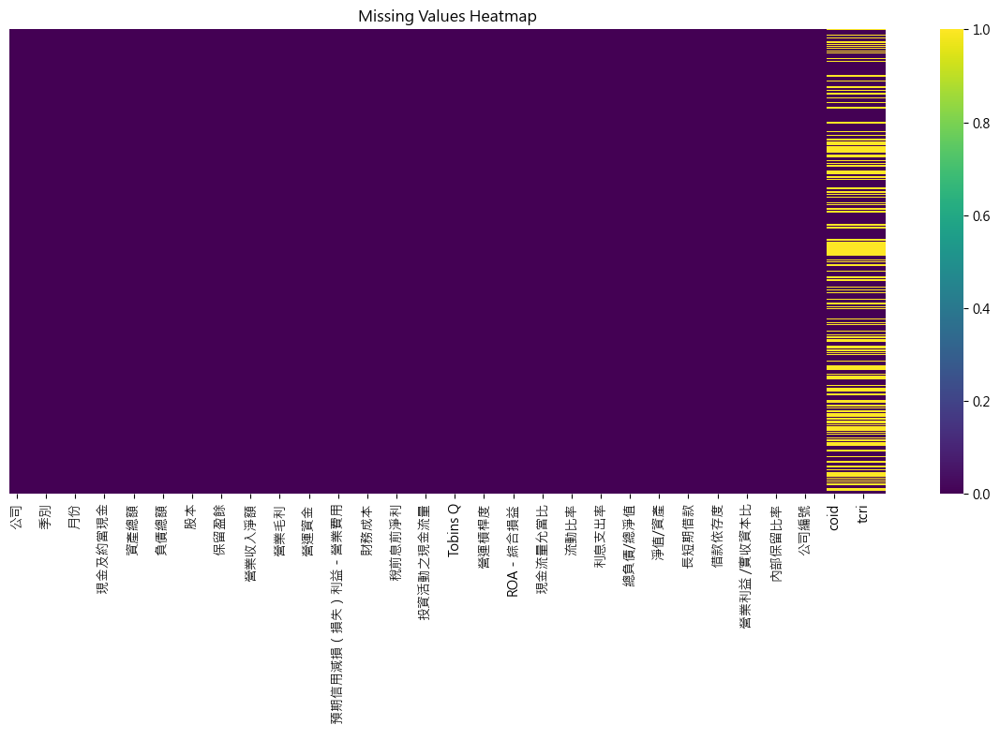

In [9]:
import seaborn as sns
import matplotlib
matplotlib.rc('font', family='Microsoft JhengHei')
# Missing values analysis
print("=== Missing Values Analysis ===")
missing_data = merged_data.isnull().sum()
missing_percentage = (merged_data.isnull().sum() / len(merged_data)) * 100

missing_df = pd.DataFrame({
    'Variable': missing_data.index,
    'Missing Count': missing_data.values,
    'Missing Percentage': missing_percentage.values
})

# show missing values
missing_df = missing_df[missing_df['Missing Count'] > 0].sort_values('Missing Count', ascending=False)
print(missing_df.to_string(index=False))

# Target variable missing values
target_missing = merged_data['tcri'].isnull().sum()
print(f"\nTarget variable (tcri) missing: {target_missing} ({target_missing/len(merged_data)*100:.2f}%)")

# Visualize missing values
plt.figure(figsize=(12, 8))
sns.heatmap(merged_data.isnull(), cbar=True, yticklabels=False, cmap='viridis')
plt.title('Missing Values Heatmap')
plt.tight_layout()
plt.show()

### 移除特殊字

In [27]:
def clean_numeric(value):
    if pd.isna(value) or value == '--':
        return np.nan
    if isinstance(value, str):
        value = value.replace(',', '').replace(' ', '')
        try:
            return float(value)
        except:
            return np.nan
    return value

numeric_columns = merged_data.select_dtypes(include=[object]).columns
for col in numeric_columns:
    merged_data[col] = merged_data[col].apply(clean_numeric)

merged_data.shape

(11014, 60)

### 計算相關性

In [28]:
correlation_matrix = merged_data.select_dtypes(include=[np.number]).corr()

high_corr_pairs = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        corr_value = abs(correlation_matrix.iloc[i, j])
        if corr_value > 0.5:  # cor
            high_corr_pairs.append((
                correlation_matrix.columns[i],
                correlation_matrix.columns[j],
                corr_value
            ))

high_corr_pairs.sort(key=lambda x: x[2], reverse=True)

for pair in high_corr_pairs[:30]:  # show 30
    print(f"{pair[0]} vs {pair[1]}: {pair[2]:.3f}")

負債比率 vs 淨值/資產: 1.000
公司編號 vs coid: 1.000
年份 vs mdate: 1.000
    普通股股本 vs   股本: 0.999
營業利益 /實收資本比 vs 稅前純益 /實收資本: 0.998
內部保留比率 vs 股利支付率: 0.997
營業利益 vs 稅前淨利: 0.996
營業利益 vs 稅前息前淨利: 0.993
營業收入淨額 vs 營業成本: 0.990
資產總額 vs 負債總額: 0.989
稅前淨利 vs 稅前息前淨利: 0.988
營業毛利 vs 稅前息前淨利: 0.974
營業毛利 vs 稅前淨利: 0.969
流動資產 vs 流動負債: 0.968
營業利益 vs 來自營運之現金流量: 0.967
營業毛利 vs 營業利益: 0.962
  保留盈餘 vs 股東權益總額: 0.960
  現金及約當現金 vs 營運資金: 0.956
  保留盈餘 vs 營業毛利: 0.950
  保留盈餘 vs 稅前息前淨利: 0.949
  保留盈餘 vs 稅前淨利: 0.945
流動資產 vs 營業收入淨額: 0.935
股東權益總額 vs 營業毛利: 0.935
  保留盈餘 vs 營業利益: 0.933
營業毛利 vs 來自營運之現金流量: 0.933
  現金及約當現金 vs 股東權益總額: 0.931
流動資產 vs 資產總額: 0.930
  現金及約當現金 vs   保留盈餘: 0.928
總負債/總淨值 vs 借款依存度: 0.926
稅前淨利 vs 來自營運之現金流量: 0.925


### 熱力圖

C:\Users\jack9\python\Lib\site-packages\seaborn\utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
C:\Users\jack9\python\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


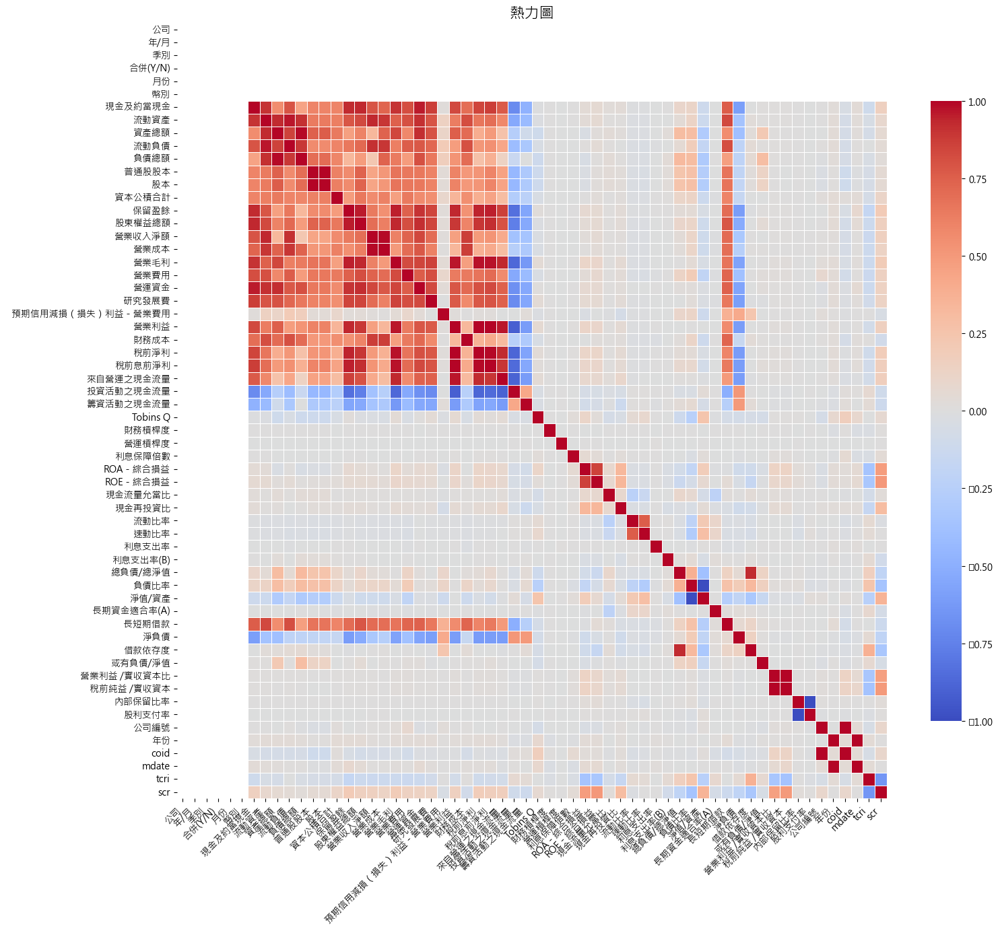

In [29]:
import seaborn as sns
plt.figure(figsize=(16, 14))
sns.heatmap(correlation_matrix, 
           annot=False, 
           cmap='coolwarm', 
           center=0,
           linewidths=0.5,
           cbar_kws={"shrink": 0.8})
plt.title('熱力圖', fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

In [30]:
feature_importance = correlation_matrix.abs().mean().sort_values(ascending=False)

for i, (feature, score) in enumerate(feature_importance.items()):
    print(f"{i+1:2d}. {feature}: {score:.3f}")

 1. 股東權益總額: 0.376
 2. 營運資金: 0.375
 3. 營業毛利: 0.373
 4.   現金及約當現金: 0.369
 5. 流動資產: 0.367
 6.   保留盈餘: 0.357
 7.   研究發展費: 0.351
 8. 稅前息前淨利: 0.345
 9. 營業費用: 0.343
10. 營業利益: 0.338
11. 流動負債: 0.331
12. 稅前淨利: 0.330
13. 長短期借款: 0.327
14. 資產總額: 0.324
15.   股本: 0.307
16.     普通股股本: 0.306
17. 營業收入淨額: 0.301
18. 來自營運之現金流量: 0.300
19. 營業成本: 0.296
20. 負債總額: 0.284
21. 財務成本: 0.280
22. 投資活動之現金流量: 0.279
23.   資本公積合計: 0.261
24. 淨負債: 0.233
25. 籌資活動之現金流量: 0.217
26. scr: 0.164
27. 負債比率: 0.148
28. 淨值/資產: 0.148
29. tcri: 0.127
30. 總負債/總淨值: 0.112
31. ROA－綜合損益: 0.106
32. ROE－綜合損益: 0.101
33. 借款依存度: 0.089
34. coid: 0.080
35. Tobins Q: 0.072
36. 現金再投資比: 0.071
37. 稅前純益 /實收資本: 0.070
38.   預期信用減損（損失）利益－營業費用: 0.070
39. 營業利益 /實收資本比: 0.069
40. 速動比率: 0.065
41. 流動比率: 0.062
42. mdate: 0.059
43. 年份: 0.059
44. 公司編號: 0.052
45. 或有負債/淨值: 0.052
46. 現金流量允當比: 0.051
47. 內部保留比率: 0.045
48. 股利支付率: 0.041
49. 長期資金適合率(A): 0.035
50. 利息支出率(B): 0.031
51. 利息保障倍數: 0.029
52. 利息支出率: 0.024
53. 財務槓桿度: 0.022
54. 營運槓桿度: 0.021
55. 公司: nan
56. 年/月: nan
57

C:\Users\jack9\python\Lib\site-packages\pandas\plotting\_matplotlib\misc.py:121: RuntimeWarning: invalid value encountered in cast
  if np.all(locs == locs.astype(int)):


<Figure size 1600x1600 with 0 Axes>

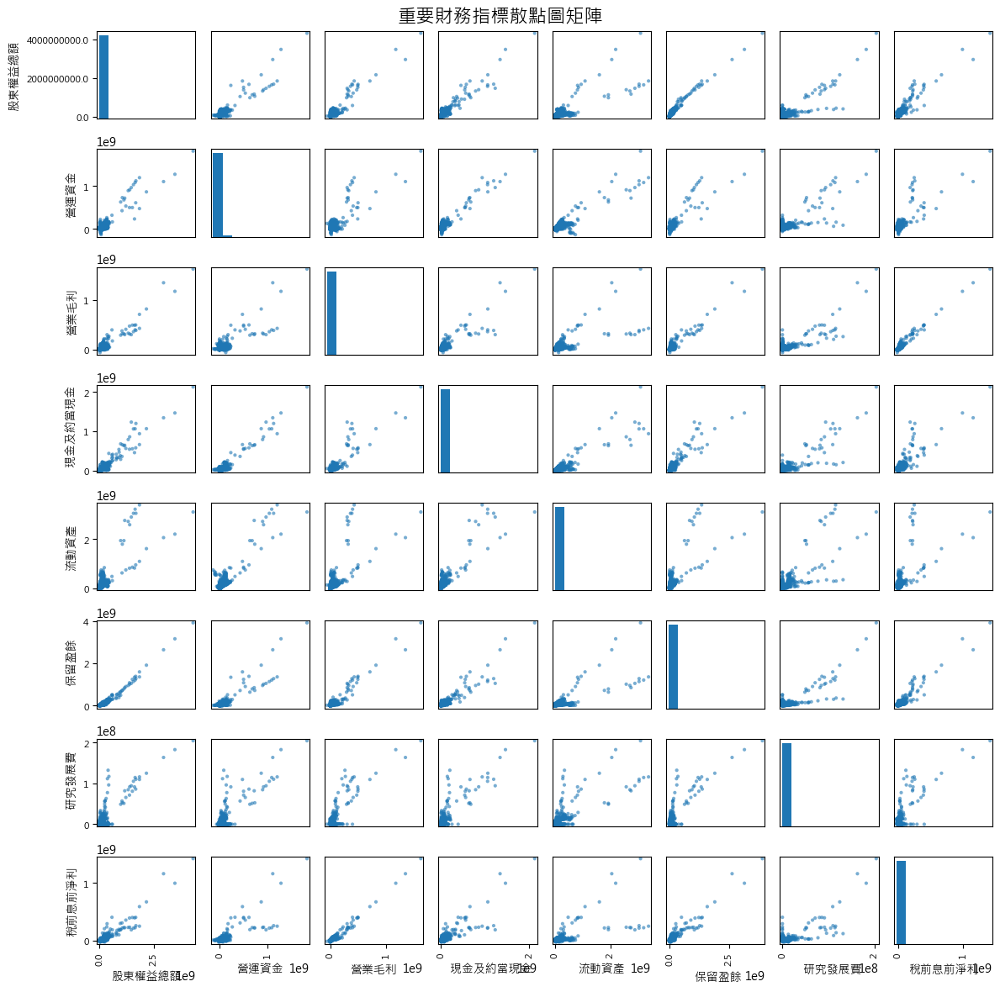

In [32]:
top_features = feature_importance.head(8).index.tolist()
if len(top_features) >= 3:
    from pandas.plotting import scatter_matrix
    
    plt.figure(figsize=(16, 16))
    scatter_matrix(merged_data[top_features], 
                  alpha=0.6, 
                  figsize=(12, 12), 
                  diagonal='hist')
    plt.suptitle('重要財務指標散點圖矩陣', fontsize=16)
    plt.tight_layout()
    plt.show()

公司編號 vs coid: 1.000
年份 vs mdate: 1.000
    普通股股本 vs   股本: 0.999
營業利益 /實收資本比 vs 稅前純益 /實收資本: 0.998
營業利益 vs 稅前淨利: 0.996
營業利益 vs 稅前息前淨利: 0.993
營業收入淨額 vs 營業成本: 0.990
資產總額 vs 負債總額: 0.989
稅前淨利 vs 稅前息前淨利: 0.988
營業毛利 vs 稅前息前淨利: 0.974
營業毛利 vs 稅前淨利: 0.969
流動資產 vs 流動負債: 0.968
營業利益 vs 來自營運之現金流量: 0.967
營業毛利 vs 營業利益: 0.962
  保留盈餘 vs 股東權益總額: 0.960
  現金及約當現金 vs 營運資金: 0.956
  保留盈餘 vs 營業毛利: 0.950
  保留盈餘 vs 稅前息前淨利: 0.949
  保留盈餘 vs 稅前淨利: 0.945
流動資產 vs 營業收入淨額: 0.935
股東權益總額 vs 營業毛利: 0.935
  保留盈餘 vs 營業利益: 0.933
營業毛利 vs 來自營運之現金流量: 0.933
  現金及約當現金 vs 股東權益總額: 0.931
流動資產 vs 資產總額: 0.930
  現金及約當現金 vs   保留盈餘: 0.928
總負債/總淨值 vs 借款依存度: 0.926
稅前淨利 vs 來自營運之現金流量: 0.925
股東權益總額 vs 稅前息前淨利: 0.918
資產總額 vs 營運資金: 0.918


C:\Users\jack9\AppData\Local\Temp\ipykernel_28560\663952305.py:31: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  plt.tight_layout()
C:\Users\jack9\python\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


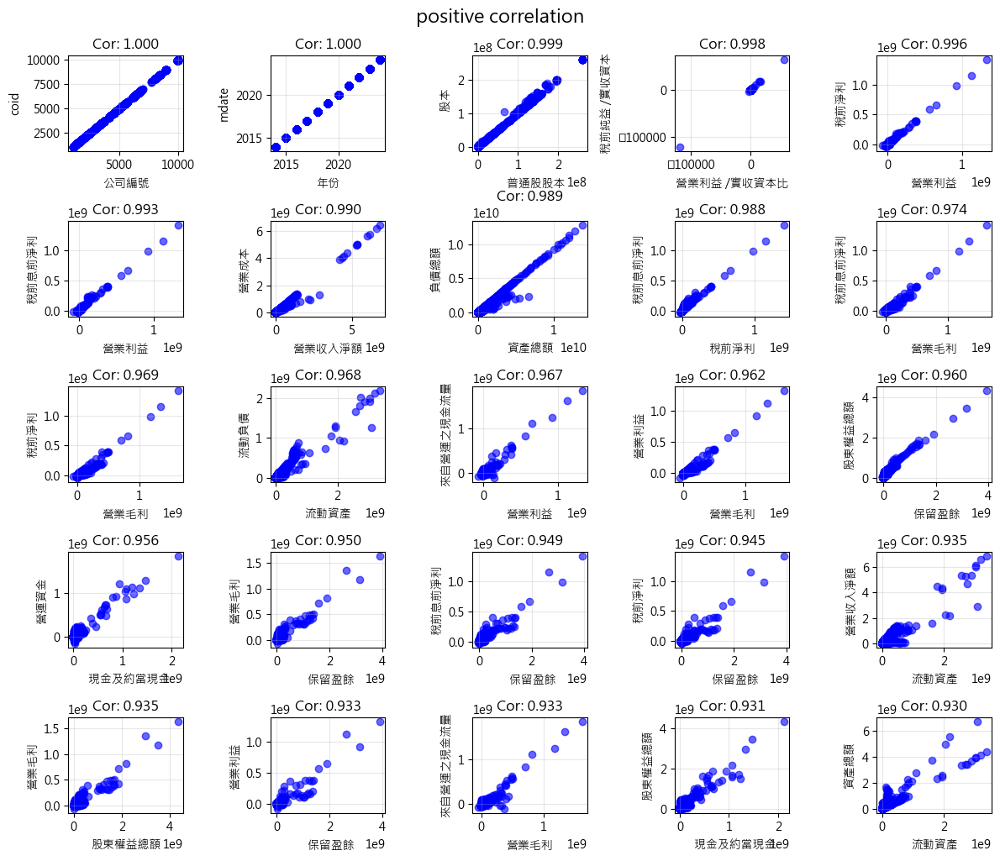

In [34]:
positive_corr_pairs = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        corr_value = correlation_matrix.iloc[i, j]
        if corr_value > 0.3:  # cor>0.5
            positive_corr_pairs.append((
                correlation_matrix.columns[i],
                correlation_matrix.columns[j],
                corr_value
            ))

positive_corr_pairs.sort(key=lambda x: x[2], reverse=True)# 從最高到最低

for pair in positive_corr_pairs[:30]:  # show 30
    print(f"{pair[0]} vs {pair[1]}: {pair[2]:.3f}")

if positive_corr_pairs:
    top_positive_pairs = positive_corr_pairs[:25]
    
    fig, axes = plt.subplots(5, 5, figsize=(12, 10))
    axes = axes.ravel()
    
    for idx, (feature1, feature2, corr_value) in enumerate(top_positive_pairs):
        if idx < 25:  # 25
            axes[idx].scatter(merged_data[feature1], merged_data[feature2], alpha=0.6, color='blue')
            axes[idx].set_xlabel(feature1)
            axes[idx].set_ylabel(feature2)
            axes[idx].set_title(f'Cor: {corr_value:.3f}')
            axes[idx].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.suptitle('positive correlation', fontsize=16, y=1.02)
    plt.show()

### Categorical (NOT YET)


3. CATEGORICAL VARIABLES FREQUENCY

公司 Frequency Distribution:
Total unique values: 1030
公司
1101 台泥        11
4106 雃博        11
3669 圓展        11
3673 TPK-KY    11
3679 新至陞       11
3686 達能        11
3694 海華        11
3701 大眾控       11
3702 大聯大       11
3703 欣陸        11
Name: count, dtype: int64

年/月 Frequency Distribution:
Total unique values: 11
年/月
2024/12    1029
2022/12    1029
2023/12    1029
2021/12    1028
2020/12    1023
2019/12    1013
2018/12     998
2017/12     986
2016/12     975
2015/12     959
Name: count, dtype: int64


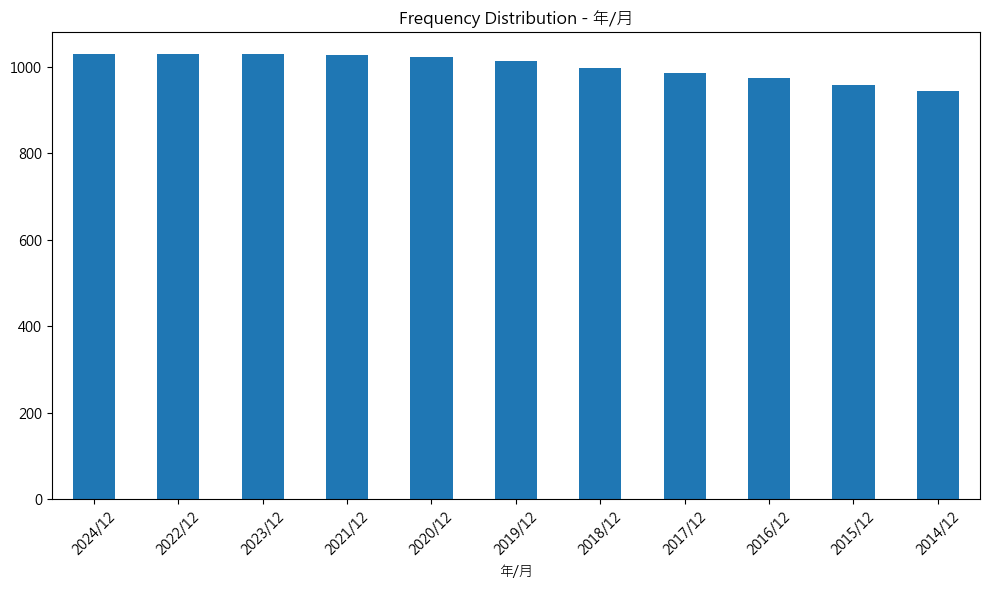


合併(Y/N) Frequency Distribution:
Total unique values: 2
合併(Y/N)
Y    10378
N      636
Name: count, dtype: int64


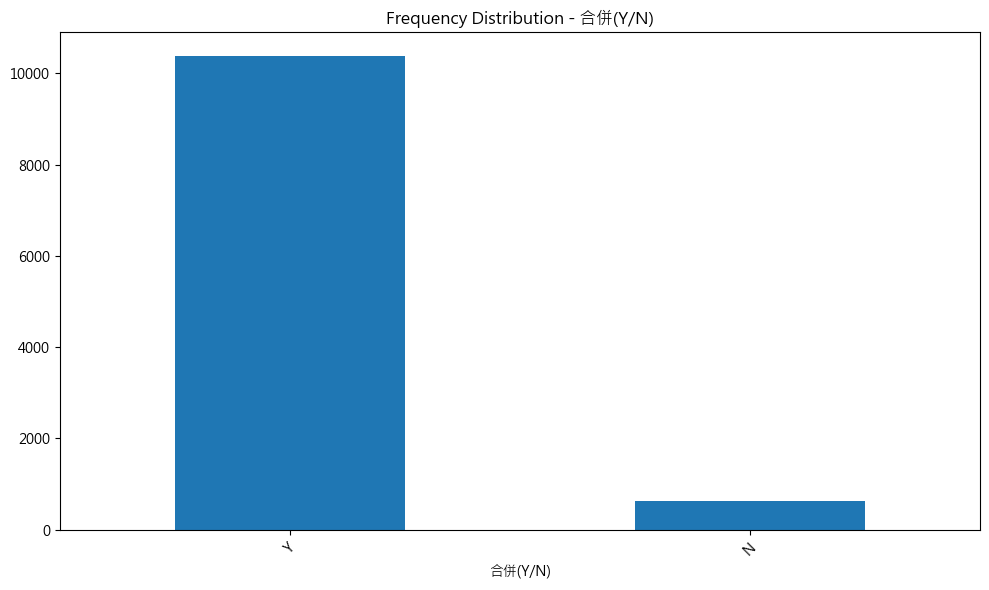


幣別 Frequency Distribution:
Total unique values: 1
幣別
NTD    11014
Name: count, dtype: int64


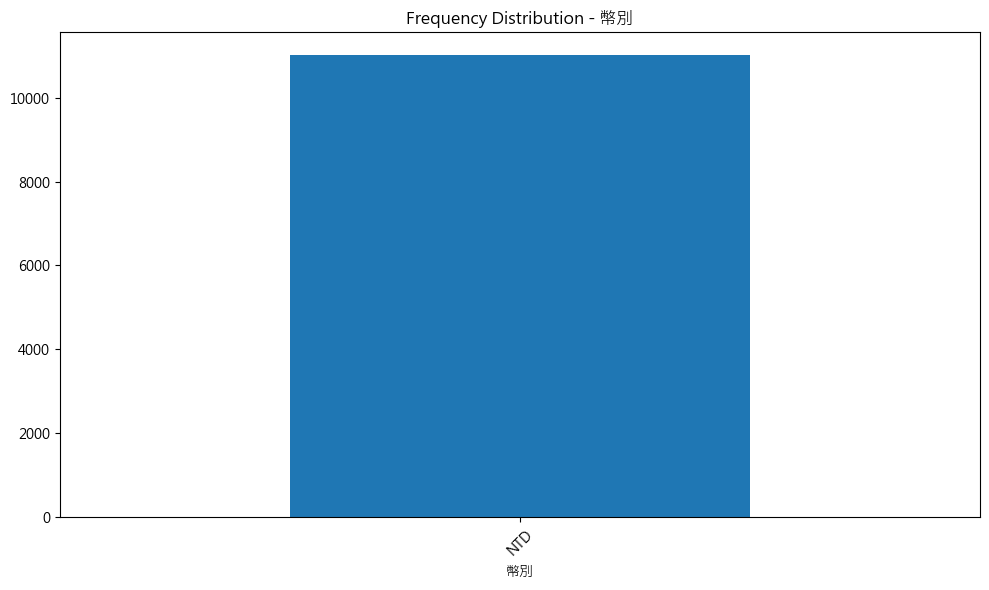


  現金及約當現金 Frequency Distribution:
Total unique values: 11000
  現金及約當現金
101,579      2
239,601      2
616,436      2
520,648      2
373,909      2
1,468,956    2
573,450      2
491,638      2
255,482      2
994,321      2
Name: count, dtype: int64

流動資產 Frequency Distribution:
Total unique values: 10672
流動資產
-            341
2,531,015      2
1,938,505      2
1,779,939      1
1,466,895      1
2,306,995      1
2,357,299      1
2,027,262      1
1,962,845      1
2,115,234      1
Name: count, dtype: int64

資產總額 Frequency Distribution:
Total unique values: 11014
資產總額
593,413,647    1
6,916,866      1
3,030,217      1
1,563,707      1
7,581,853      1
5,744,361      1
8,038,168      1
7,910,882      1
4,394,531      1
7,173,226      1
Name: count, dtype: int64

流動負債 Frequency Distribution:
Total unique values: 10668
流動負債
-            341
3,221,457      2
2,655,411      2
238,654        2
1,096,038      2
1,077,121      2
760,497        2
989,039        1
1,370,297      1
632,369        1
Name

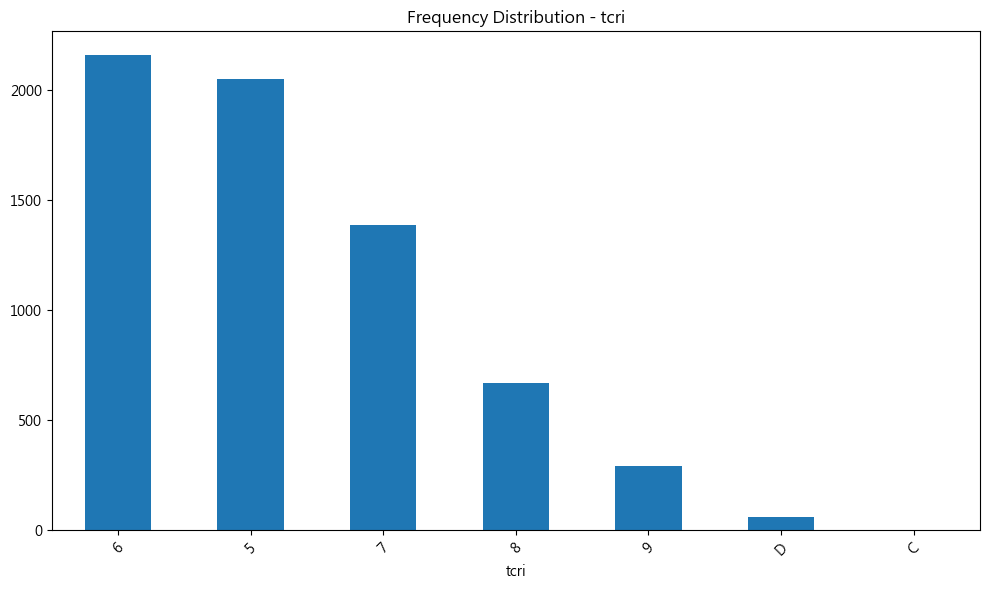

In [11]:
print("\n" + "="*50)
print("3. CATEGORICAL VARIABLES FREQUENCY")
print("="*50)

categorical_vars = merged_data.select_dtypes(include=['object']).columns.tolist()

if categorical_vars:
    for col in categorical_vars:
        print(f"\n{col} Frequency Distribution:")
        freq = merged_data[col].value_counts()
        print(f"Total unique values: {len(freq)}")
        print(freq.head(10))  
        
        if len(freq) <= 20:  
            plt.figure(figsize=(10, 6))
            freq.plot(kind='bar')
            plt.title(f'Frequency Distribution - {col}')
            plt.xticks(rotation=45)
            plt.tight_layout()
            plt.show()
else:
    print("No categorical variables found in the dataset.")


3. CATEGORICAL VARIABLES FREQUENCY - COMPLETE VISUALIZATION
Found 51 categorical variables:
['公司', '年/月', '合併(Y/N)', '幣別', '  現金及約當現金', '流動資產', '資產總額', '流動負債', '負債總額', '    普通股股本', '  股本', '  資本公積合計', '  保留盈餘', '股東權益總額', '營業收入淨額', '營業成本', '營業毛利', '營業費用', '營運資金', '  研究發展費', '  預期信用減損（損失）利益－營業費用', '營業利益', '財務成本', '稅前淨利', '稅前息前淨利', '來自營運之現金流量', '投資活動之現金流量', '籌資活動之現金流量', 'Tobins Q', '財務槓桿度', '營運槓桿度', '利息保障倍數', 'ROA－綜合損益', 'ROE－綜合損益', '現金流量允當比', '現金再投資比', '流動比率', '速動比率', '利息支出率', '利息支出率(B)', '總負債/總淨值', '長期資金適合率(A)', '長短期借款', '淨負債', '借款依存度', '或有負債/淨值', '營業利益 /實收資本比', '稅前純益 /實收資本', '內部保留比率', '股利支付率', 'tcri']

Variable 1: 公司
Total unique values: 1030
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
公司
1101 台泥        11
4106 雃博        11
3669 圓展        11
3673 TPK-KY    11
3679 新至陞       11
3686 達能        11
3694 海華        11
3701 大眾控       11
3702 大聯大       11
3703 欣陸        11
3704 合勤控       11
3705 永信        11
3706 神達        11
4104 佳醫        11
4108 懷特        1

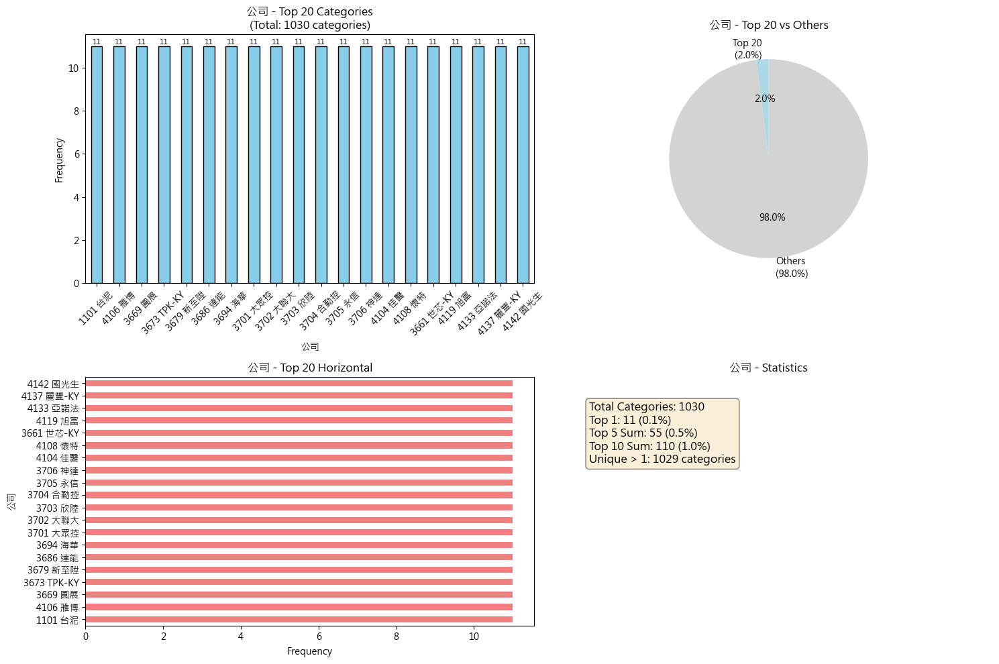


Detailed Statistics for 公司:
  Most frequent value: '1101 台泥' (count: 11, 0.1%)
  Least frequent value: '3716 中化控股' (count: 1, 0.0%)
  Top 5 values cover: 0.5% of data
  Categories with count = 1: 1

Variable 2: 年/月
Total unique values: 11
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
年/月
2024/12    1029
2022/12    1029
2023/12    1029
2021/12    1028
2020/12    1023
2019/12    1013
2018/12     998
2017/12     986
2016/12     975
2015/12     959
2014/12     945
Name: count, dtype: int64


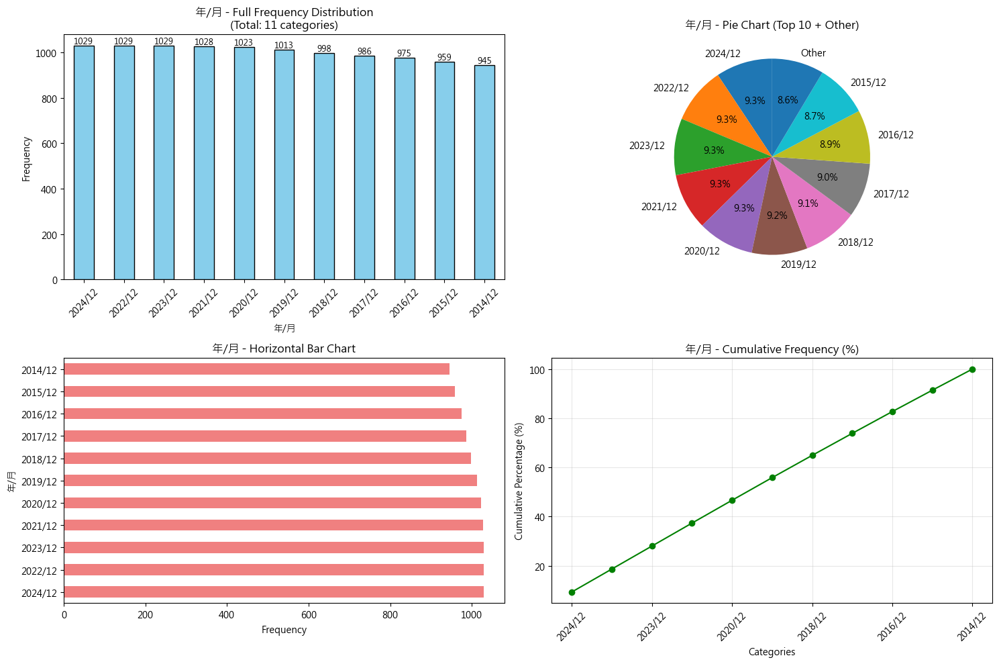


Detailed Statistics for 年/月:
  Most frequent value: '2024/12' (count: 1029, 9.3%)
  Least frequent value: '2014/12' (count: 945, 8.6%)
  Top 5 values cover: 46.6% of data
  Categories with count = 1: 0

Variable 3: 合併(Y/N)
Total unique values: 2
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
合併(Y/N)
Y    10378
N      636
Name: count, dtype: int64


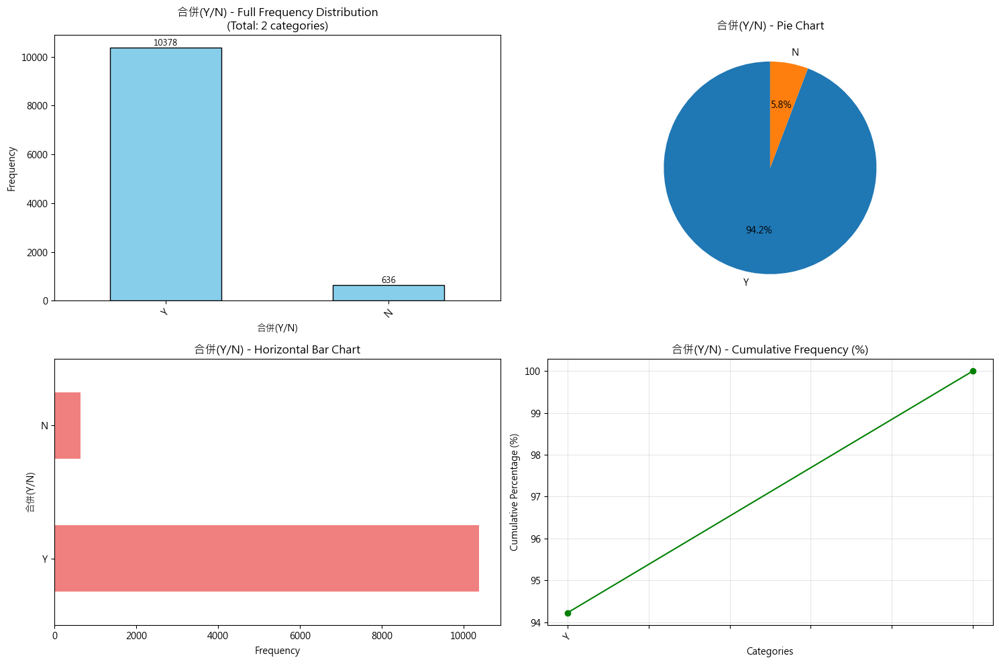


Detailed Statistics for 合併(Y/N):
  Most frequent value: 'Y' (count: 10378, 94.2%)
  Least frequent value: 'N' (count: 636, 5.8%)
  Top 5 values cover: 100.0% of data
  Categories with count = 1: 0

Variable 4: 幣別
Total unique values: 1
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
幣別
NTD    11014
Name: count, dtype: int64


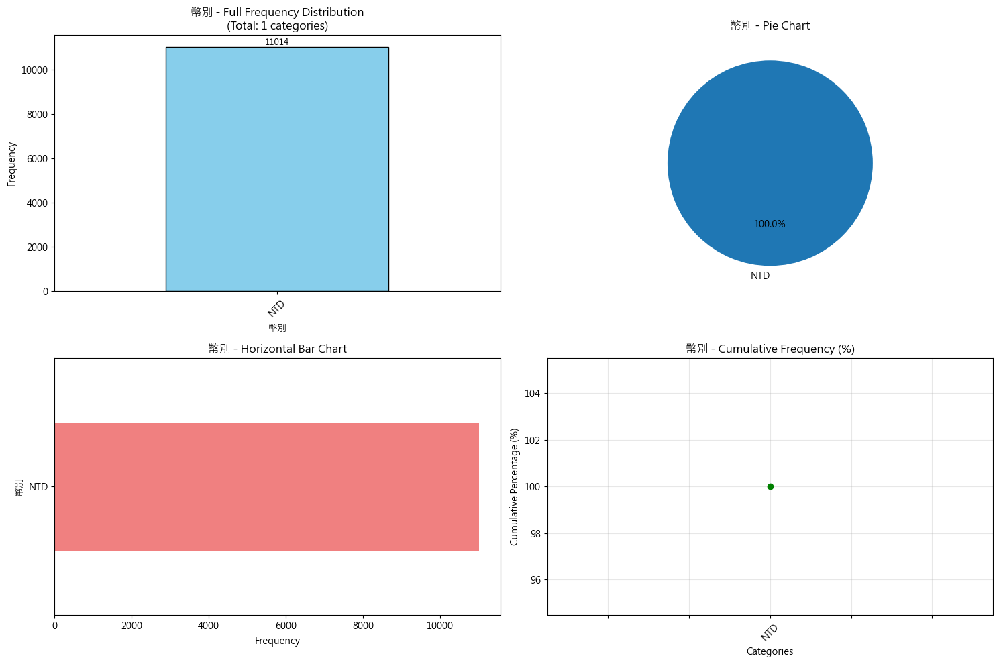


Detailed Statistics for 幣別:
  Most frequent value: 'NTD' (count: 11014, 100.0%)
  Least frequent value: 'NTD' (count: 11014, 100.0%)
  Top 5 values cover: 100.0% of data
  Categories with count = 1: 0

Variable 5:   現金及約當現金
Total unique values: 11000
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
  現金及約當現金
101,579      2
239,601      2
616,436      2
520,648      2
373,909      2
1,468,956    2
573,450      2
491,638      2
255,482      2
994,321      2
126,354      2
816,356      2
251,893      2
1,194,354    2
776,394      1
Name: count, dtype: int64


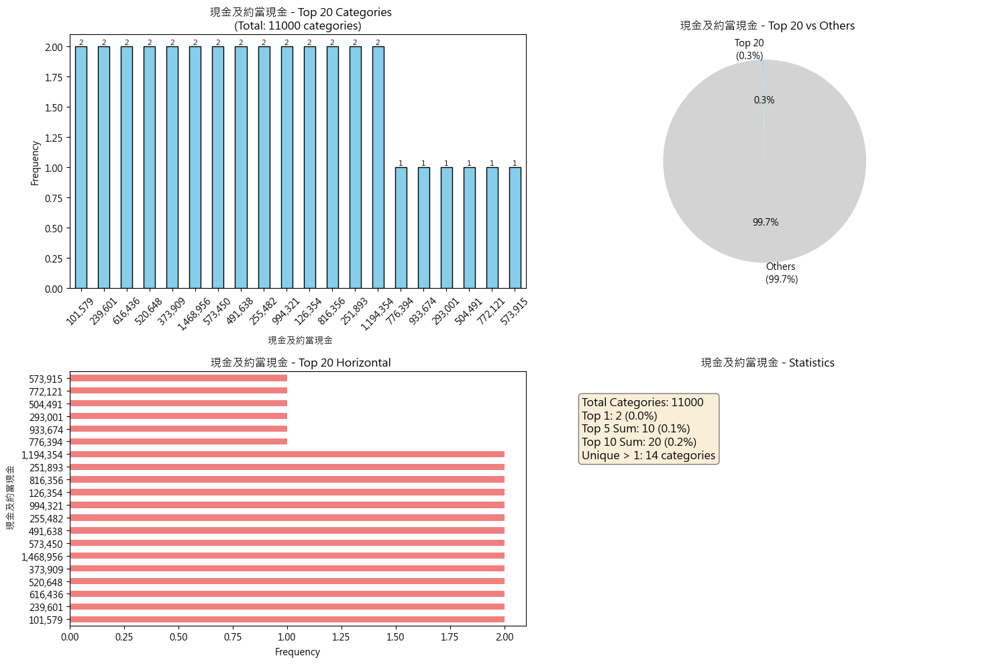


Detailed Statistics for   現金及約當現金:
  Most frequent value: '101,579' (count: 2, 0.0%)
  Least frequent value: '1,488,247' (count: 1, 0.0%)
  Top 5 values cover: 0.1% of data
  Categories with count = 1: 10986

Variable 6: 流動資產
Total unique values: 10672
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
流動資產
-            341
2,531,015      2
1,938,505      2
1,779,939      1
1,466,895      1
2,306,995      1
2,357,299      1
2,027,262      1
1,962,845      1
2,115,234      1
2,721,843      1
2,063,196      1
1,189,953      1
2,169,205      1
2,231,499      1
Name: count, dtype: int64


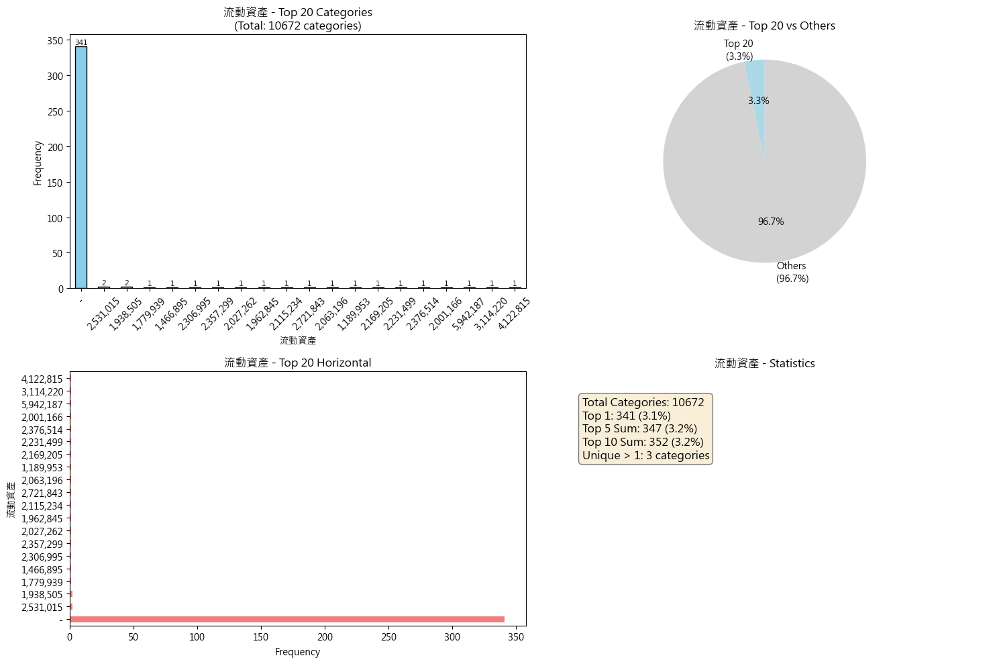


Detailed Statistics for 流動資產:
  Most frequent value: '-' (count: 341, 3.1%)
  Least frequent value: '10,826,420' (count: 1, 0.0%)
  Top 5 values cover: 3.2% of data
  Categories with count = 1: 10669

Variable 7: 資產總額
Total unique values: 11014
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
資產總額
593,413,647    1
6,916,866      1
3,030,217      1
1,563,707      1
7,581,853      1
5,744,361      1
8,038,168      1
7,910,882      1
4,394,531      1
7,173,226      1
5,218,530      1
1,697,185      1
6,084,282      1
8,108,233      1
7,890,838      1
Name: count, dtype: int64


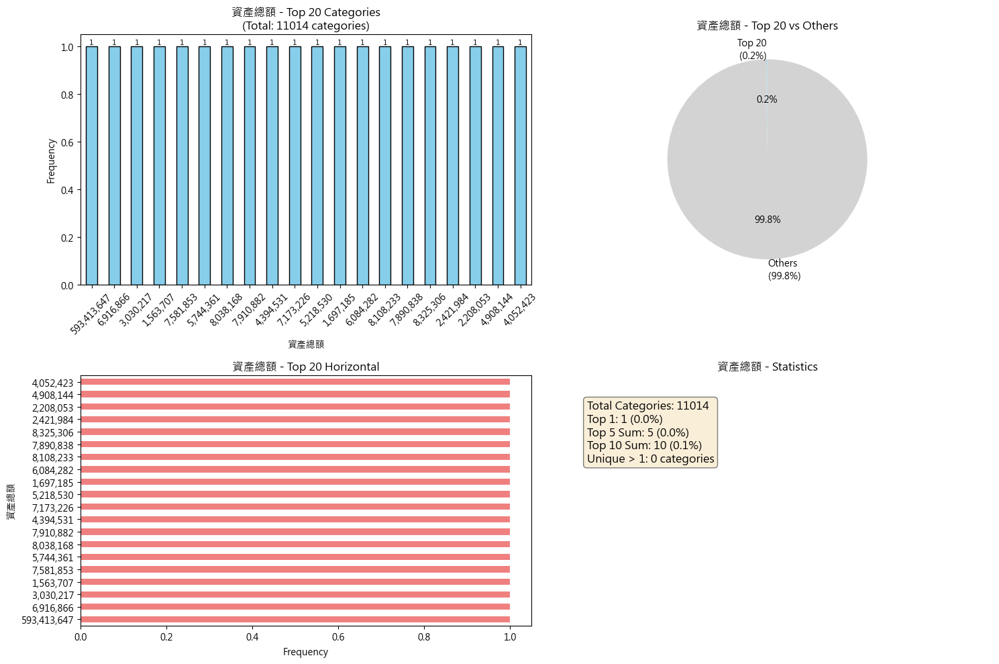


Detailed Statistics for 資產總額:
  Most frequent value: '593,413,647' (count: 1, 0.0%)
  Least frequent value: '26,868,051' (count: 1, 0.0%)
  Top 5 values cover: 0.0% of data
  Categories with count = 1: 11014

Variable 8: 流動負債
Total unique values: 10668
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
流動負債
-            341
3,221,457      2
2,655,411      2
238,654        2
1,096,038      2
1,077,121      2
760,497        2
989,039        1
1,370,297      1
632,369        1
617,467        1
1,249,345      1
825,469        1
834,549        1
1,237,671      1
Name: count, dtype: int64


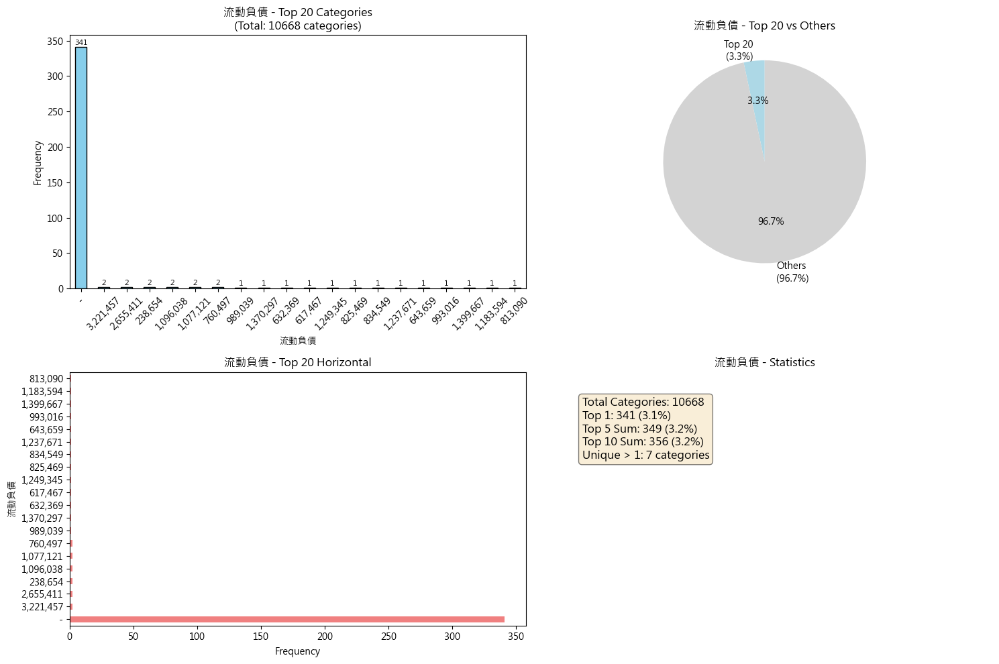


Detailed Statistics for 流動負債:
  Most frequent value: '-' (count: 341, 3.1%)
  Least frequent value: '7,242,838' (count: 1, 0.0%)
  Top 5 values cover: 3.2% of data
  Categories with count = 1: 10661

Variable 9: 負債總額
Total unique values: 11014
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
負債總額
285,505,383    1
3,226,145      1
1,754,934      1
896,165        1
3,269,453      1
2,499,897      1
3,592,340      1
3,618,446      1
2,017,898      1
3,213,605      1
2,638,965      1
897,249        1
2,766,119      1
3,634,030      1
3,498,787      1
Name: count, dtype: int64


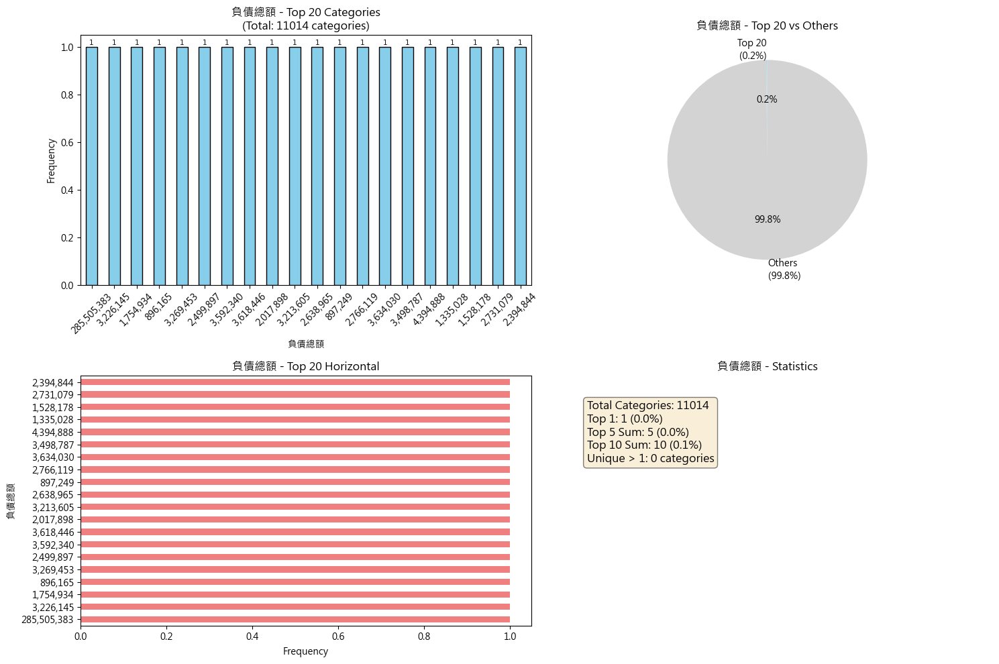


Detailed Statistics for 負債總額:
  Most frequent value: '285,505,383' (count: 1, 0.0%)
  Least frequent value: '16,786,460' (count: 1, 0.0%)
  Top 5 values cover: 0.0% of data
  Categories with count = 1: 11014

Variable 10:     普通股股本
Total unique values: 4908
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
    普通股股本
600,000      42
2,000,000    33
1,500,000    31
1,000,000    27
300,000      23
726,000      22
800,000      21
630,000      21
700,000      18
675,000      16
2,200,000    14
1,800,000    12
1,050,000    12
1,980,000    12
1,020,000    12
Name: count, dtype: int64


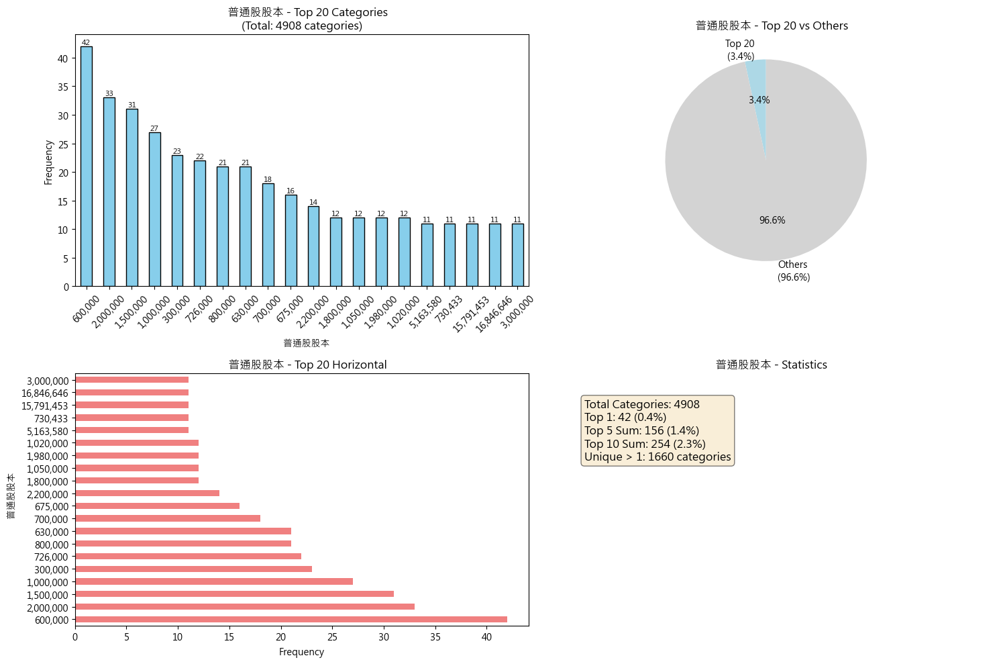


Detailed Statistics for     普通股股本:
  Most frequent value: '600,000' (count: 42, 0.4%)
  Least frequent value: '2,312,789' (count: 1, 0.0%)
  Top 5 values cover: 1.4% of data
  Categories with count = 1: 3248

Variable 11:   股本
Total unique values: 4945
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
  股本
600,000      42
2,000,000    33
1,500,000    31
1,000,000    27
300,000      24
726,000      22
630,000      21
800,000      21
700,000      18
2,200,000    14
675,000      14
1,980,000    12
1,800,000    12
1,050,000    12
1,020,000    12
Name: count, dtype: int64


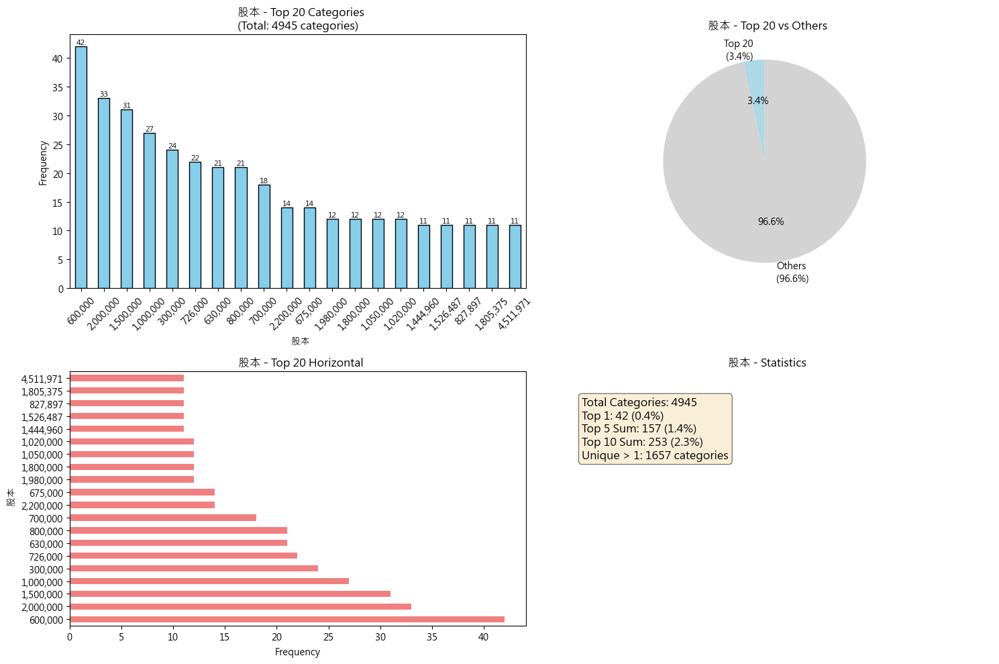


Detailed Statistics for   股本:
  Most frequent value: '600,000' (count: 42, 0.4%)
  Least frequent value: '2,312,789' (count: 1, 0.0%)
  Top 5 values cover: 1.4% of data
  Categories with count = 1: 3288

Variable 12:   資本公積合計
Total unique values: 7685
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
  資本公積合計
0          454
9           13
1,251       13
21,938      12
2,169       11
62,361      11
41          11
11          11
531,823     11
42,859      11
127,463     11
53,290      11
107,011     11
975,330     11
2,480       11
Name: count, dtype: int64


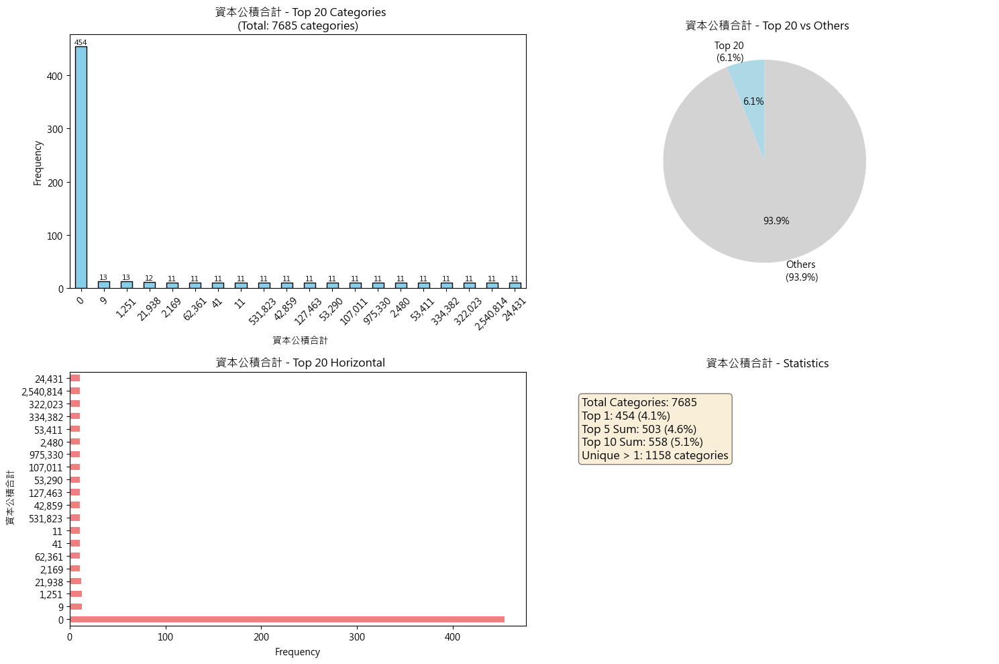


Detailed Statistics for   資本公積合計:
  Most frequent value: '0' (count: 454, 4.1%)
  Least frequent value: '2,948,844' (count: 1, 0.0%)
  Top 5 values cover: 4.6% of data
  Categories with count = 1: 6527

Variable 13:   保留盈餘
Total unique values: 11003
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
  保留盈餘
-112,944     2
459,367      2
106,751      2
14,603       2
362,838      2
416,580      2
660,460      2
5,160        2
672,830      2
526,851      2
1,407,965    2
220,714      1
202,754      1
400,679      1
812,222      1
Name: count, dtype: int64


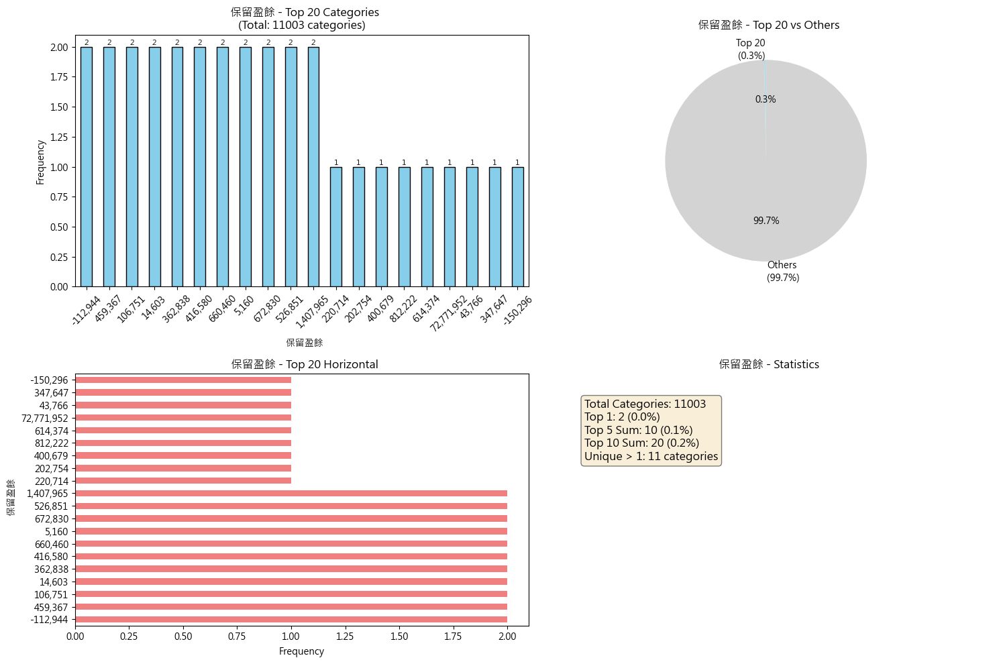


Detailed Statistics for   保留盈餘:
  Most frequent value: '-112,944' (count: 2, 0.0%)
  Least frequent value: '2,136,285' (count: 1, 0.0%)
  Top 5 values cover: 0.1% of data
  Categories with count = 1: 10992

Variable 14: 股東權益總額
Total unique values: 11012
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
股東權益總額
1,275,283      2
7,703,151      2
307,908,264    1
1,123,433      1
1,267,237      1
667,542        1
4,312,400      1
3,244,464      1
4,445,828      1
4,292,436      1
2,376,633      1
3,959,621      1
3,690,721      1
2,579,565      1
3,318,163      1
Name: count, dtype: int64


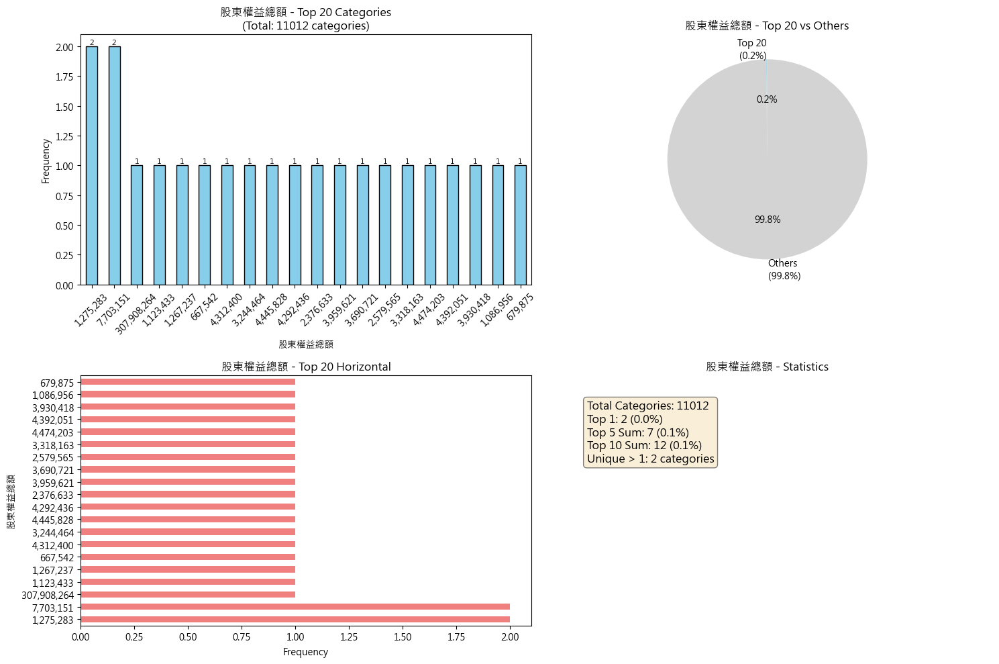


Detailed Statistics for 股東權益總額:
  Most frequent value: '1,275,283' (count: 2, 0.0%)
  Least frequent value: '10,081,591' (count: 1, 0.0%)
  Top 5 values cover: 0.1% of data
  Categories with count = 1: 11010

Variable 15: 營業收入淨額
Total unique values: 10972
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
營業收入淨額
-            20
0            18
6,441,828     2
877,438       2
117,867       2
3,243,968     2
7,231,688     2
1,524,348     2
1,760,939     1
1,816,136     1
1,374,470     1
1,181,042     1
1,257,464     1
1,244,747     1
1,654,088     1
Name: count, dtype: int64


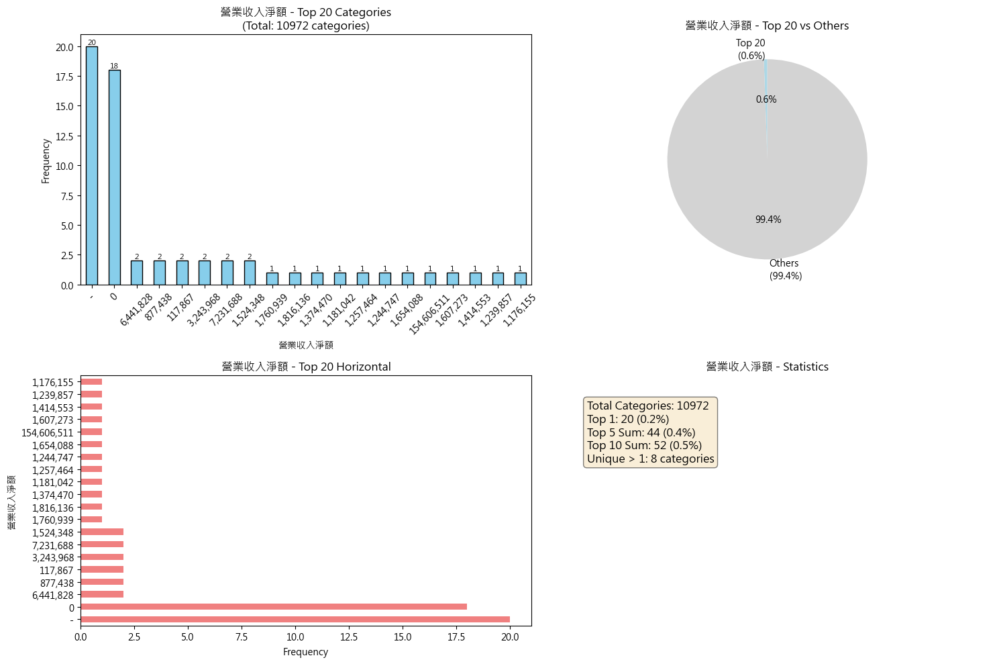


Detailed Statistics for 營業收入淨額:
  Most frequent value: '-' (count: 20, 0.2%)
  Least frequent value: '9,935,452' (count: 1, 0.0%)
  Top 5 values cover: 0.4% of data
  Categories with count = 1: 10964

Variable 16: 營業成本
Total unique values: 10693
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
營業成本
-              295
0               25
2,685,343        2
5,218,643        2
1,360,551        2
443,615          1
350,876          1
245,186          1
292,221          1
260,547          1
1,094,559        1
1,554,283        1
121,878,486      1
425,587          1
1,501,768        1
Name: count, dtype: int64


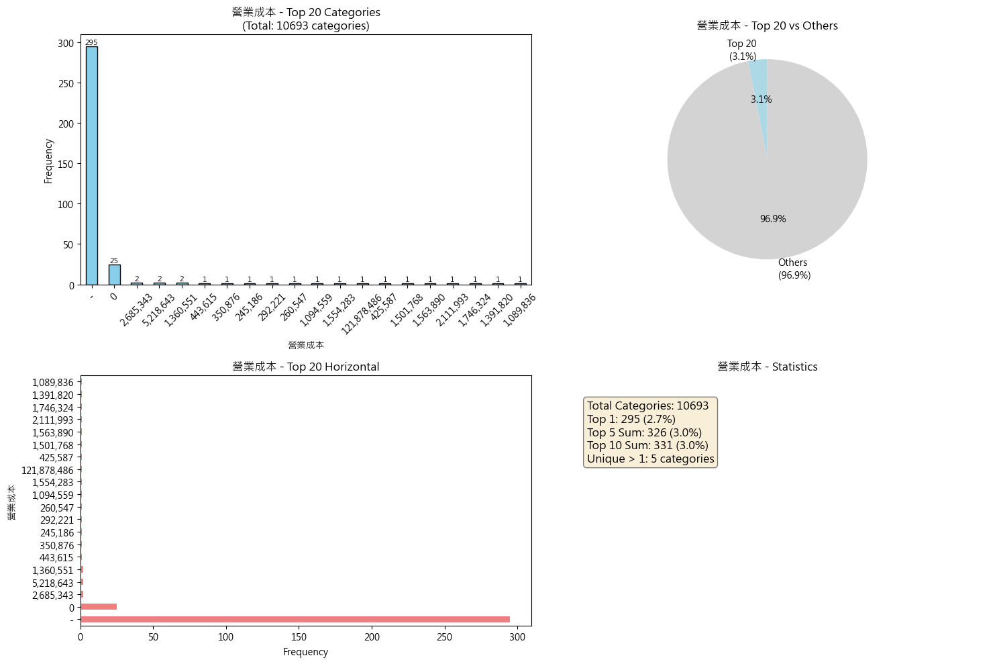


Detailed Statistics for 營業成本:
  Most frequent value: '-' (count: 295, 2.7%)
  Least frequent value: '7,795,126' (count: 1, 0.0%)
  Top 5 values cover: 3.0% of data
  Categories with count = 1: 10688

Variable 17: 營業毛利
Total unique values: 10683
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
營業毛利
-            295
0             18
1,742,768      2
181,048        2
-36            2
1,240,054      2
372,794        2
602,099        2
750,870        2
1,485,914      2
716,067        2
246,494        2
74,996         2
288,437        2
78,664         2
Name: count, dtype: int64


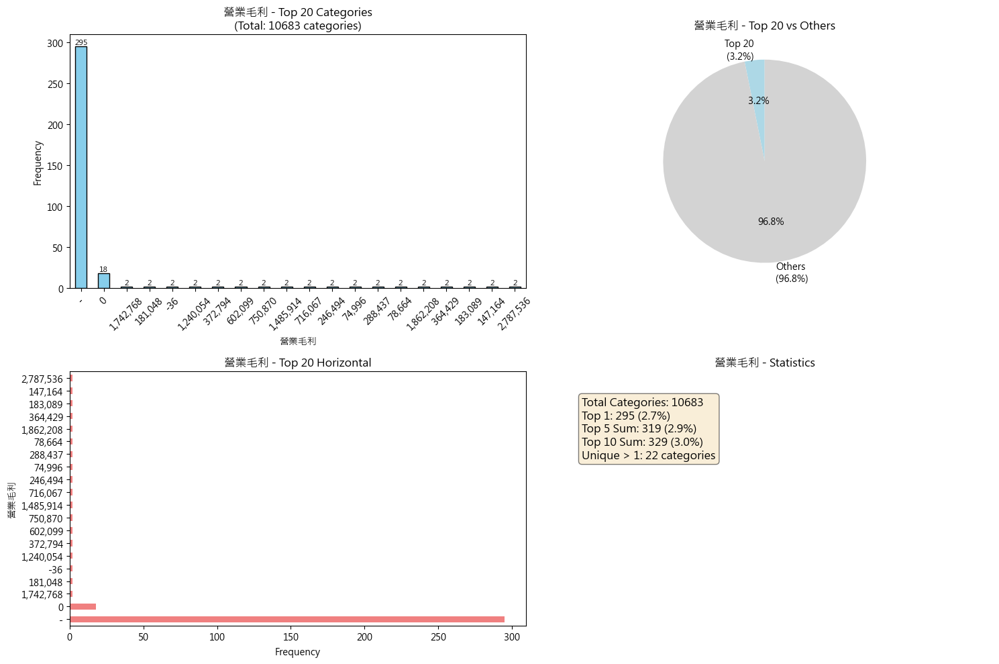


Detailed Statistics for 營業毛利:
  Most frequent value: '-' (count: 295, 2.7%)
  Least frequent value: '2,140,326' (count: 1, 0.0%)
  Top 5 values cover: 2.9% of data
  Categories with count = 1: 10661

Variable 18: 營業費用
Total unique values: 10966
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
營業費用
-          20
290,543     2
389,712     2
269,746     2
336,504     2
169,099     2
218,264     2
476,116     2
283,998     2
323,065     2
190,911     2
256,422     2
476,499     2
97,239      2
455,949     2
Name: count, dtype: int64


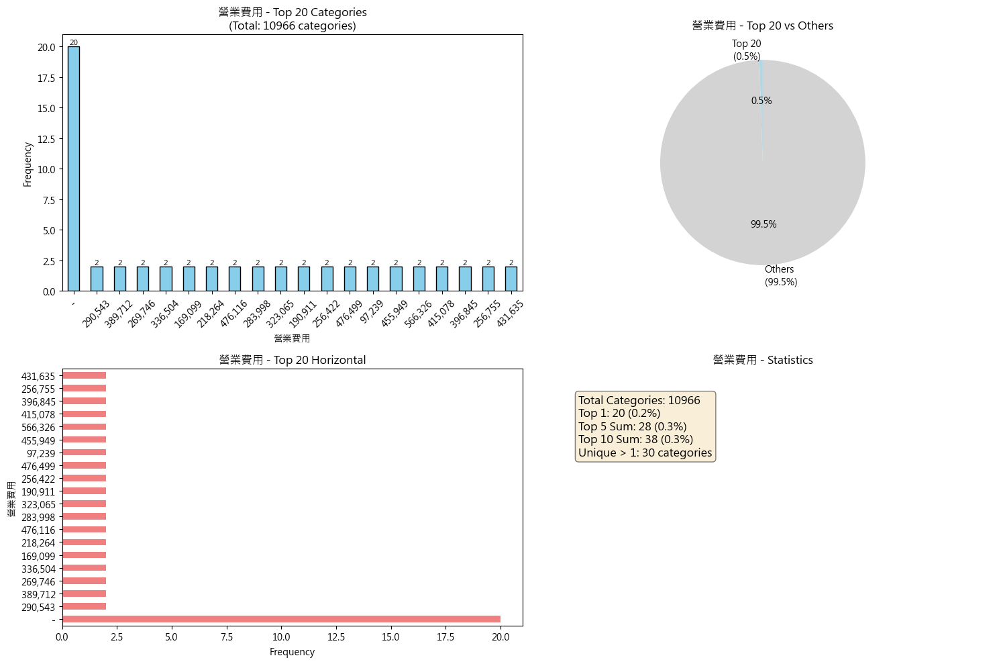


Detailed Statistics for 營業費用:
  Most frequent value: '-' (count: 20, 0.2%)
  Least frequent value: '391,768' (count: 1, 0.0%)
  Top 5 values cover: 0.3% of data
  Categories with count = 1: 10936

Variable 19: 營運資金
Total unique values: 10665
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
營運資金
-             344
1,033,731       2
1,078,389       2
160,936         2
961,712         2
2,430,319       2
1,356,295       2
87,007,198      1
630,066         1
557,584         1
427,220         1
530,594         1
641,426         1
1,317,956       1
1,522,750       1
Name: count, dtype: int64


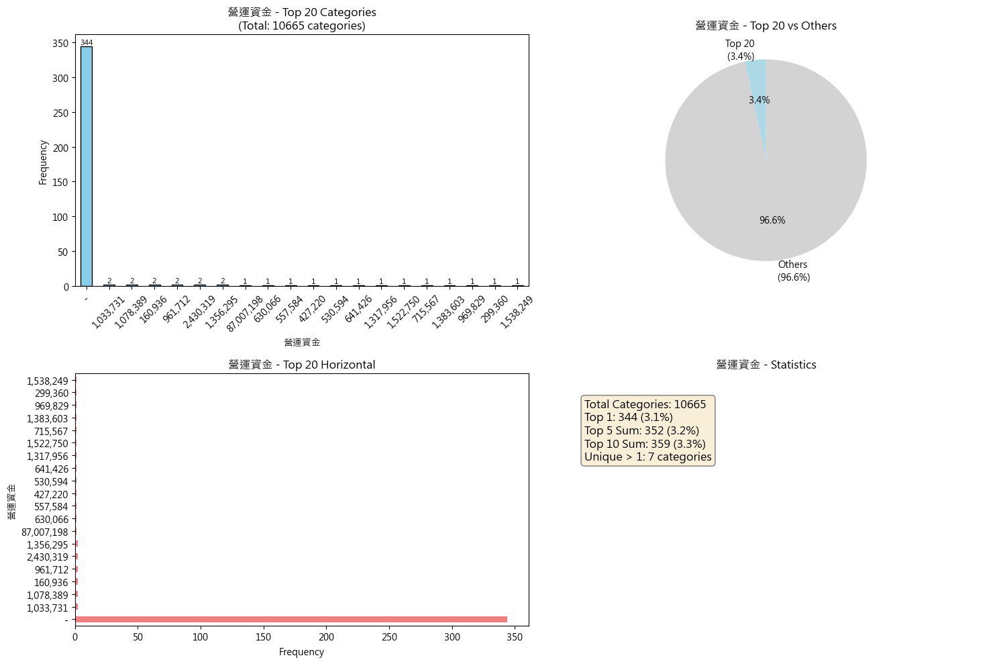


Detailed Statistics for 營運資金:
  Most frequent value: '-' (count: 344, 3.1%)
  Least frequent value: '3,583,582' (count: 1, 0.0%)
  Top 5 values cover: 3.2% of data
  Categories with count = 1: 10658

Variable 20:   研究發展費
Total unique values: 8057
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
  研究發展費
0          2214
-           637
9,369         3
4,514         3
100,017       2
85,589        2
19,990        2
18,477        2
54,787        2
6,415         2
86,281        2
72,213        2
125,021       2
18,976        2
48,648        2
Name: count, dtype: int64


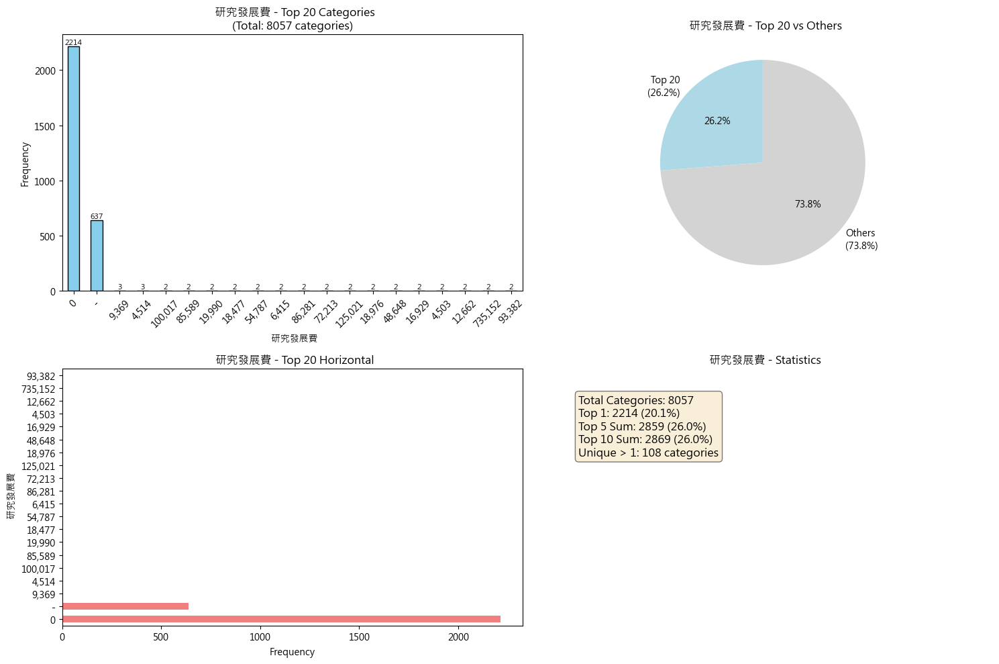


Detailed Statistics for   研究發展費:
  Most frequent value: '0' (count: 2214, 20.1%)
  Least frequent value: '2,735' (count: 1, 0.0%)
  Top 5 values cover: 26.0% of data
  Categories with count = 1: 7949

Variable 21:   預期信用減損（損失）利益－營業費用
Total unique values: 4272
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
  預期信用減損（損失）利益－營業費用
-      4202
0      1976
6         6
-5        6
3         6
-12       6
-15       6
2         6
-19       6
-97       6
55        5
-6        5
5         5
-30       5
-23       5
Name: count, dtype: int64


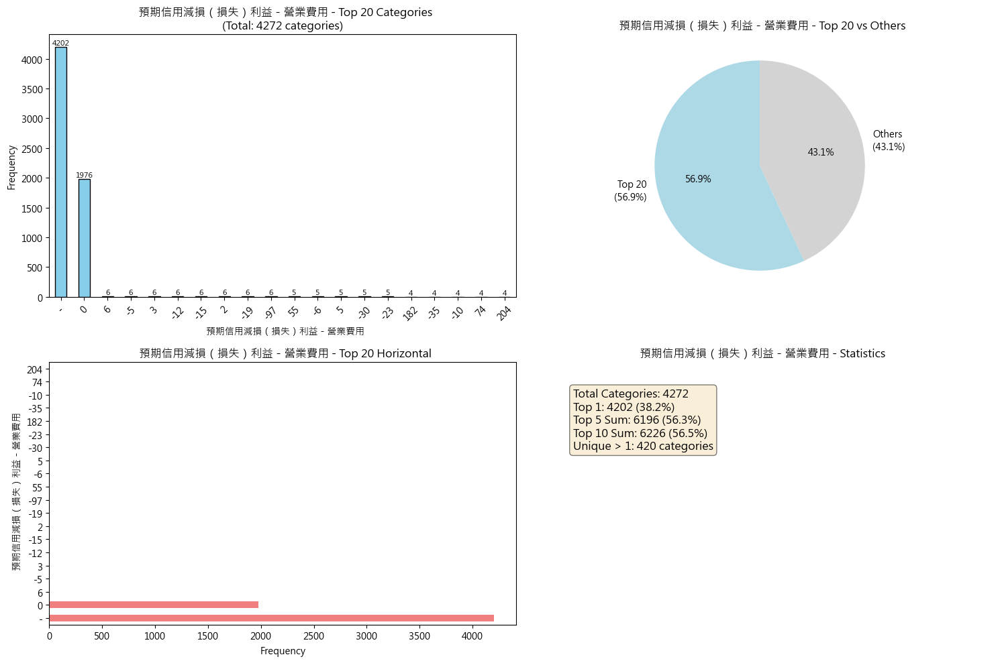


Detailed Statistics for   預期信用減損（損失）利益－營業費用:
  Most frequent value: '-' (count: 4202, 38.2%)
  Least frequent value: '16,265' (count: 1, 0.0%)
  Top 5 values cover: 56.3% of data
  Categories with count = 1: 3852

Variable 22: 營業利益
Total unique values: 10698
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
營業利益
-           295
78,839        2
312,313       2
608,491       2
-147,435      2
-80,923       2
26,198        2
406,303       2
195,137       2
-48,607       2
71,782        2
226,511       2
190,405       2
-41,685       2
1,459         2
Name: count, dtype: int64


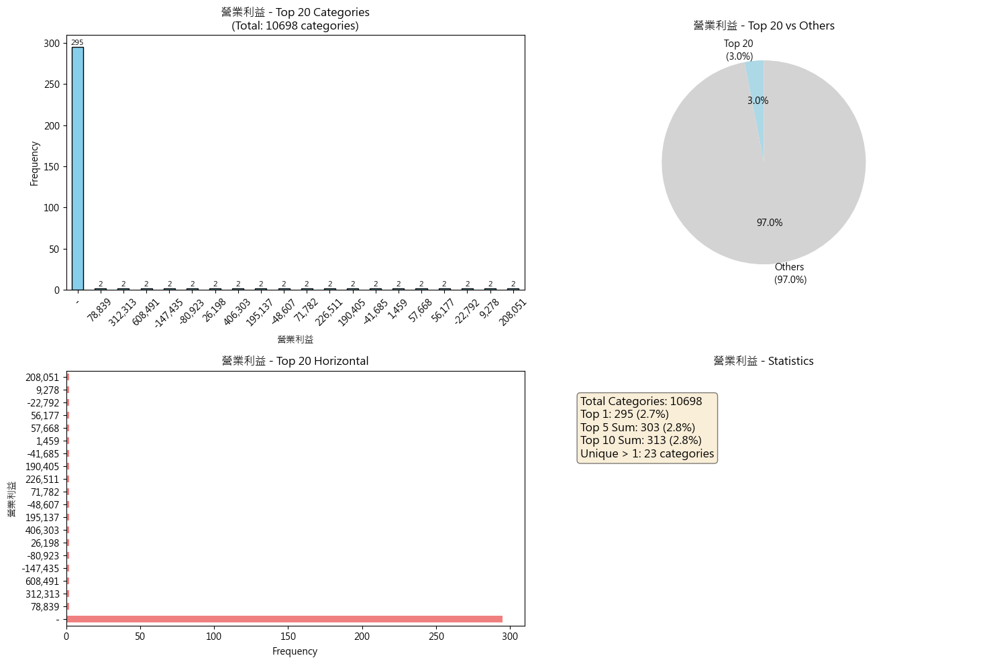


Detailed Statistics for 營業利益:
  Most frequent value: '-' (count: 295, 2.7%)
  Least frequent value: '1,748,558' (count: 1, 0.0%)
  Top 5 values cover: 2.8% of data
  Categories with count = 1: 10675

Variable 23: 財務成本
Total unique values: 9346
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
財務成本
0     384
-     329
1      12
3      11
4       8
6       8
5       8
2       7
18      7
35      6
12      6
32      6
84      6
9       5
43      5
Name: count, dtype: int64


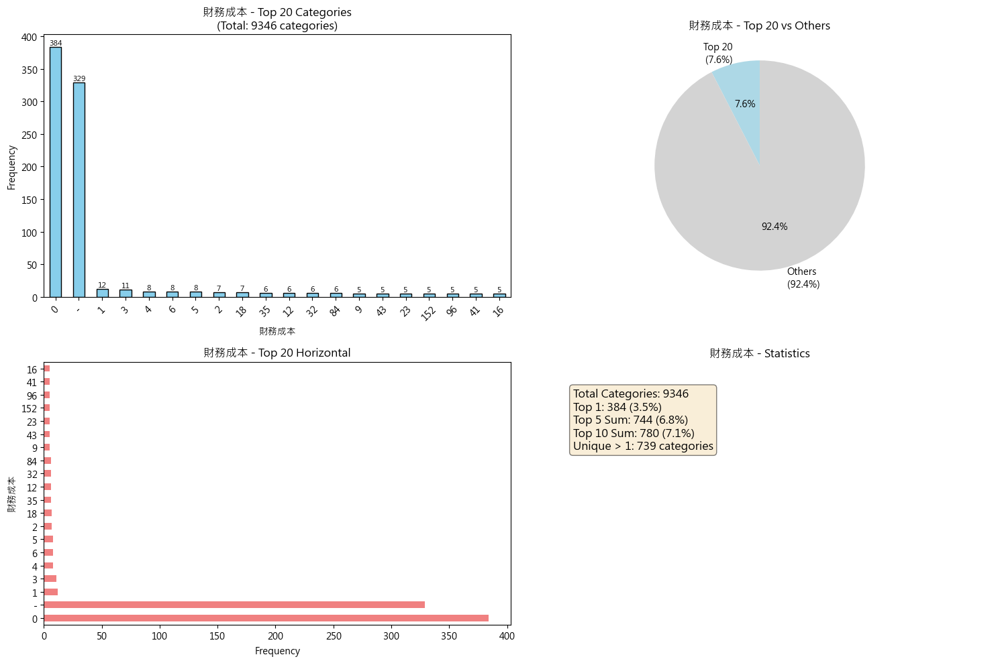


Detailed Statistics for 財務成本:
  Most frequent value: '0' (count: 384, 3.5%)
  Least frequent value: '101,628' (count: 1, 0.0%)
  Top 5 values cover: 6.8% of data
  Categories with count = 1: 8607

Variable 24: 稅前淨利
Total unique values: 10962
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
稅前淨利
-           20
603,707      2
362,600      2
-166,491     2
682,996      2
-96,499      2
443,766      2
191,805      2
172,221      2
133,841      2
113,097      2
15,889       2
202,756      2
413,017      2
-57,710      2
Name: count, dtype: int64


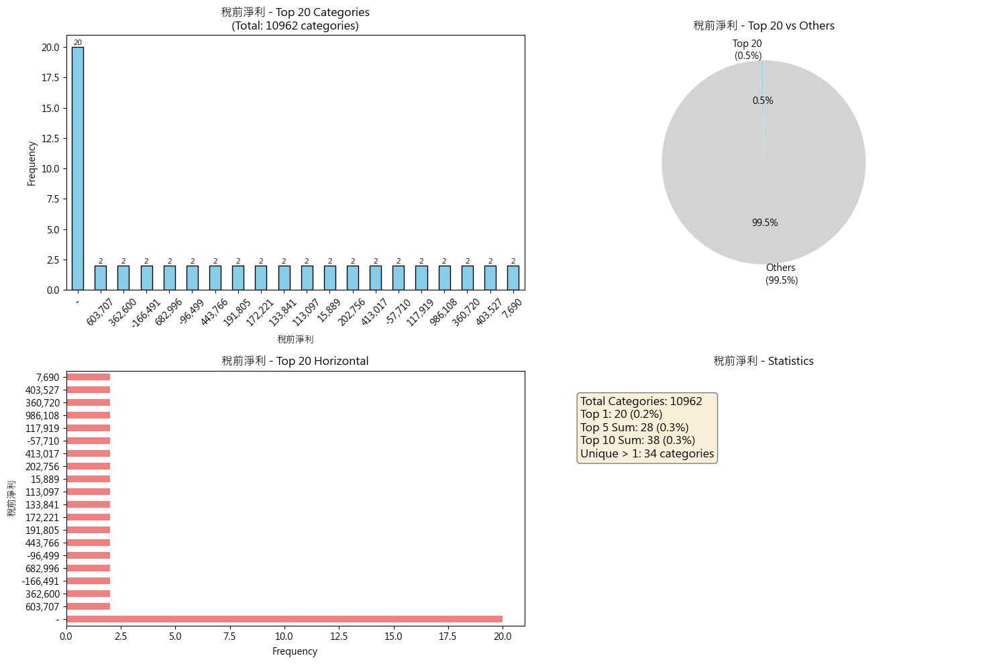


Detailed Statistics for 稅前淨利:
  Most frequent value: '-' (count: 20, 0.2%)
  Least frequent value: '1,911,220' (count: 1, 0.0%)
  Top 5 values cover: 0.3% of data
  Categories with count = 1: 10928

Variable 25: 稅前息前淨利
Total unique values: 10932
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
稅前息前淨利
-           47
24,189       2
48,934       2
296,057      2
197,396      2
720,024      2
150,404      2
157,656      2
202,925      2
245,851      2
488,826      2
318,714      2
63,083       2
218,552      2
-130,925     2
Name: count, dtype: int64


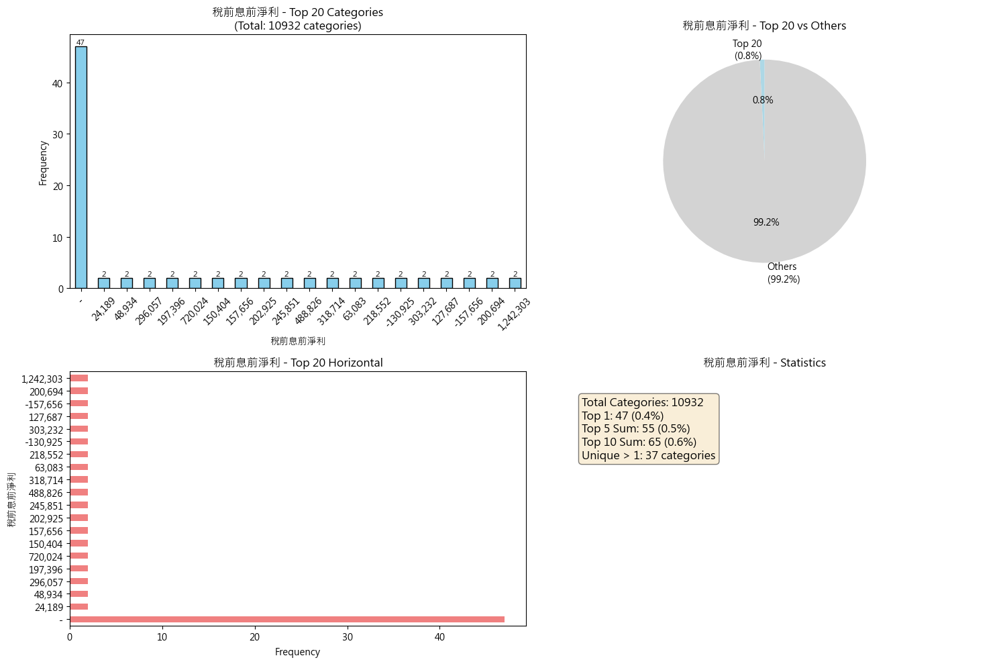


Detailed Statistics for 稅前息前淨利:
  Most frequent value: '-' (count: 47, 0.4%)
  Least frequent value: '2,012,848' (count: 1, 0.0%)
  Top 5 values cover: 0.5% of data
  Categories with count = 1: 10895

Variable 26: 來自營運之現金流量
Total unique values: 10965
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
來自營運之現金流量
-            21
70,828        2
662,295       2
455,094       2
117,948       2
443,204       2
1,097,238     2
141,930       2
183,225       2
32,418        2
33,515        2
-8,880        2
493,245       2
105,134       2
444,578       2
Name: count, dtype: int64


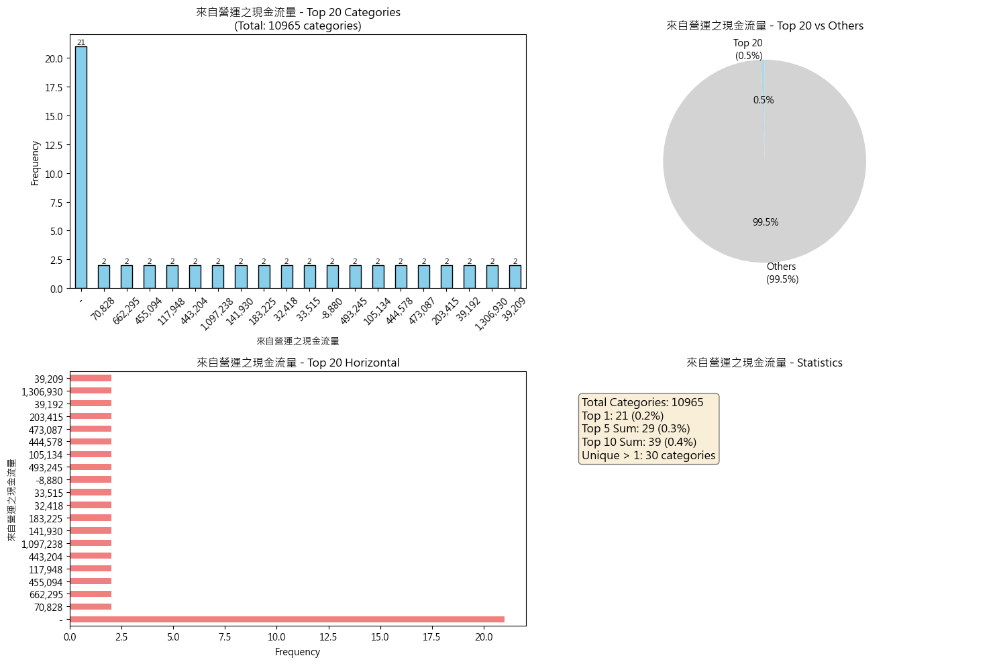


Detailed Statistics for 來自營運之現金流量:
  Most frequent value: '-' (count: 21, 0.2%)
  Least frequent value: '-756,887' (count: 1, 0.0%)
  Top 5 values cover: 0.3% of data
  Categories with count = 1: 10935

Variable 27: 投資活動之現金流量
Total unique values: 10947
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
投資活動之現金流量
-           21
0            4
12,894       2
-93,449      2
-86,570      2
-87,811      2
-31,079      2
-186,975     2
-20,915      2
-37,928      2
-311,726     2
-53,792      2
-603,383     2
-30,047      2
-56,284      2
Name: count, dtype: int64


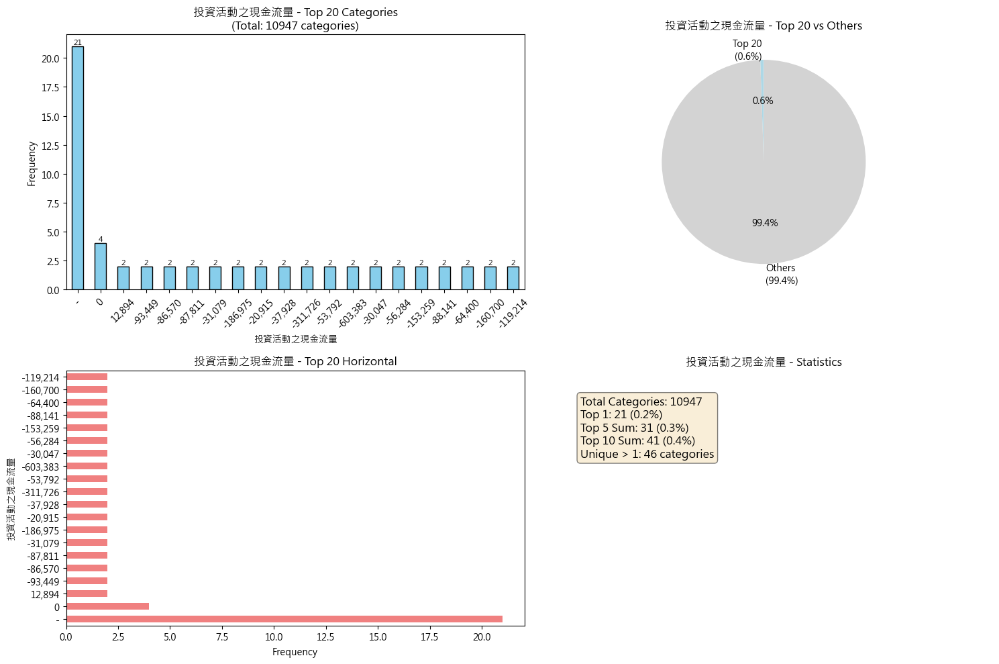


Detailed Statistics for 投資活動之現金流量:
  Most frequent value: '-' (count: 21, 0.2%)
  Least frequent value: '-5,242,873' (count: 1, 0.0%)
  Top 5 values cover: 0.3% of data
  Categories with count = 1: 10901

Variable 28: 籌資活動之現金流量
Total unique values: 10918
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
籌資活動之現金流量
0           48
-           21
-100         2
15,043       2
4,593        2
6,000        2
63,110       2
-133,704     2
29           2
-708,648     2
304,720      2
-33,693      2
-140,292     2
-884,444     2
293,663      2
Name: count, dtype: int64


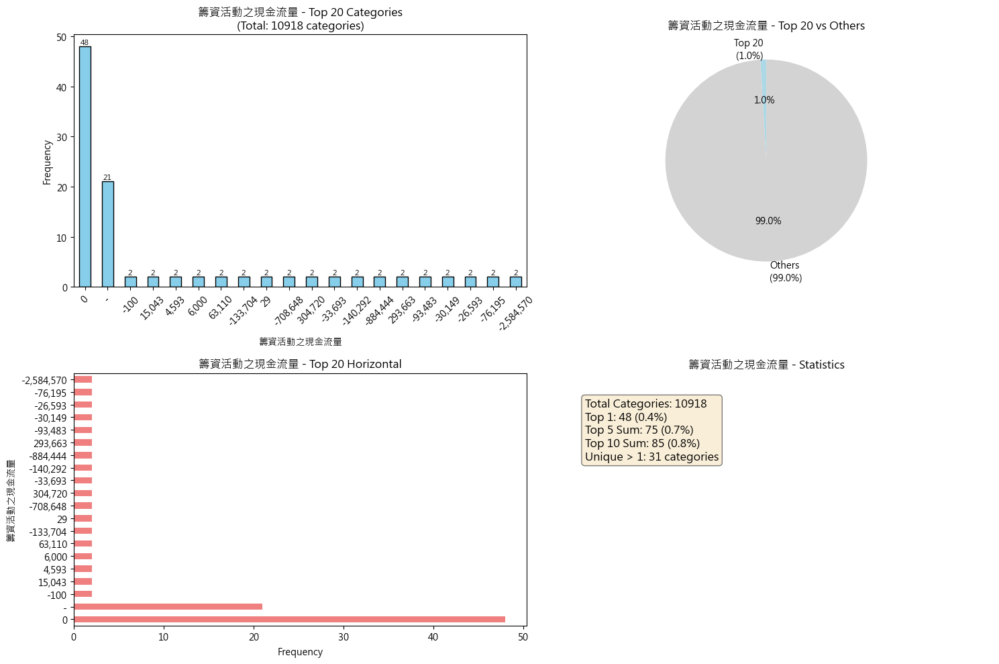


Detailed Statistics for 籌資活動之現金流量:
  Most frequent value: '0' (count: 48, 0.4%)
  Least frequent value: '5,966,004' (count: 1, 0.0%)
  Top 5 values cover: 0.7% of data
  Categories with count = 1: 10887

Variable 29: Tobins Q
Total unique values: 579
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
Tobins Q
0.82    161
0.8     136
0.87    130
0.77    128
0.76    128
0.72    126
0.71    125
0.81    125
0.86    124
0.73    124
0.85    122
0.7     120
0.68    119
0.9     118
0.75    118
Name: count, dtype: int64


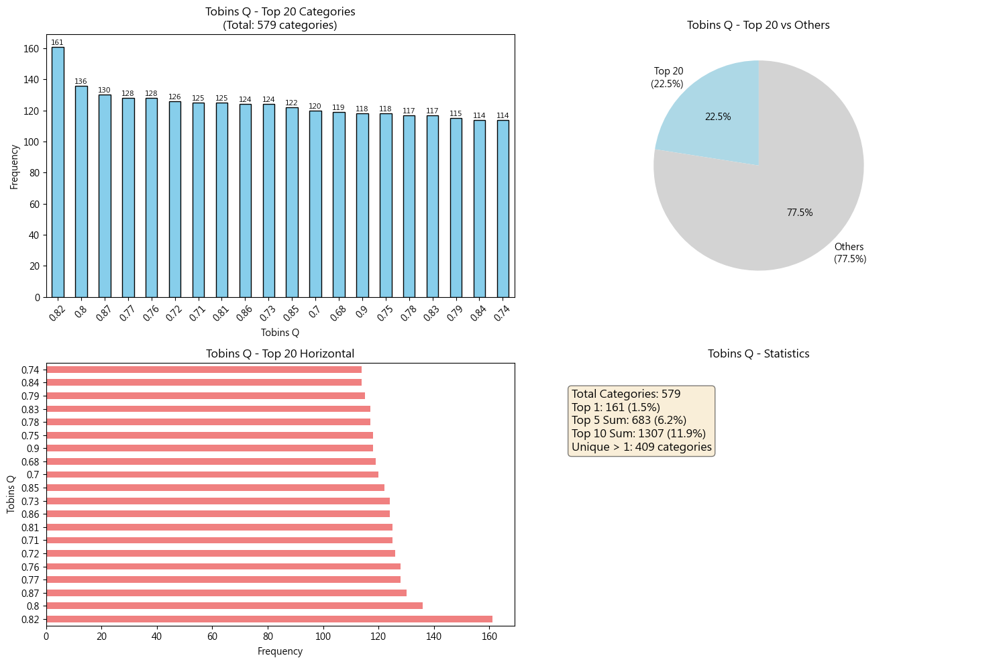


Detailed Statistics for Tobins Q:
  Most frequent value: '0.82' (count: 161, 1.5%)
  Least frequent value: '3.59' (count: 1, 0.0%)
  Top 5 values cover: 6.2% of data
  Categories with count = 1: 170

Variable 30: 財務槓桿度
Total unique values: 618
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
財務槓桿度
1       1702
-       1686
1.01     807
1.02     578
1.03     442
1.04     377
1.05     325
1.06     261
1.07     251
1.08     202
1.1      182
1.09     171
1.11     155
1.13     116
1.12     108
Name: count, dtype: int64


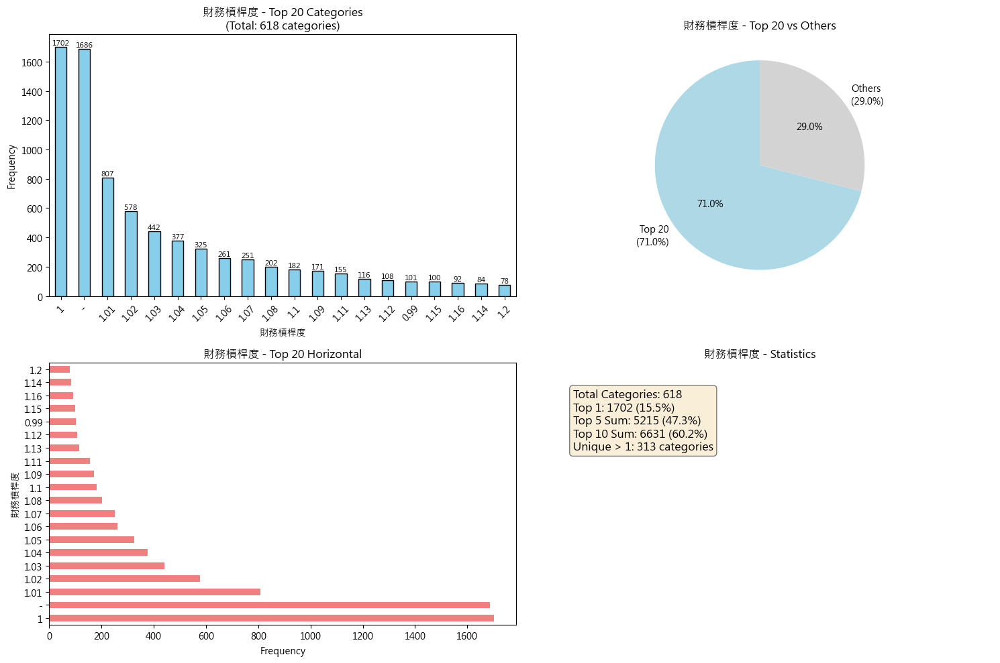


Detailed Statistics for 財務槓桿度:
  Most frequent value: '1' (count: 1702, 15.5%)
  Least frequent value: '-0.7' (count: 1, 0.0%)
  Top 5 values cover: 47.3% of data
  Categories with count = 1: 305

Variable 31: 營運槓桿度
Total unique values: 2174
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
營運槓桿度
-       1813
1        199
1.16      59
1.2       57
1.18      55
1.24      53
1.13      49
1.3       47
1.12      46
1.23      46
1.09      43
1.17      43
1.25      42
1.11      42
1.1       42
Name: count, dtype: int64


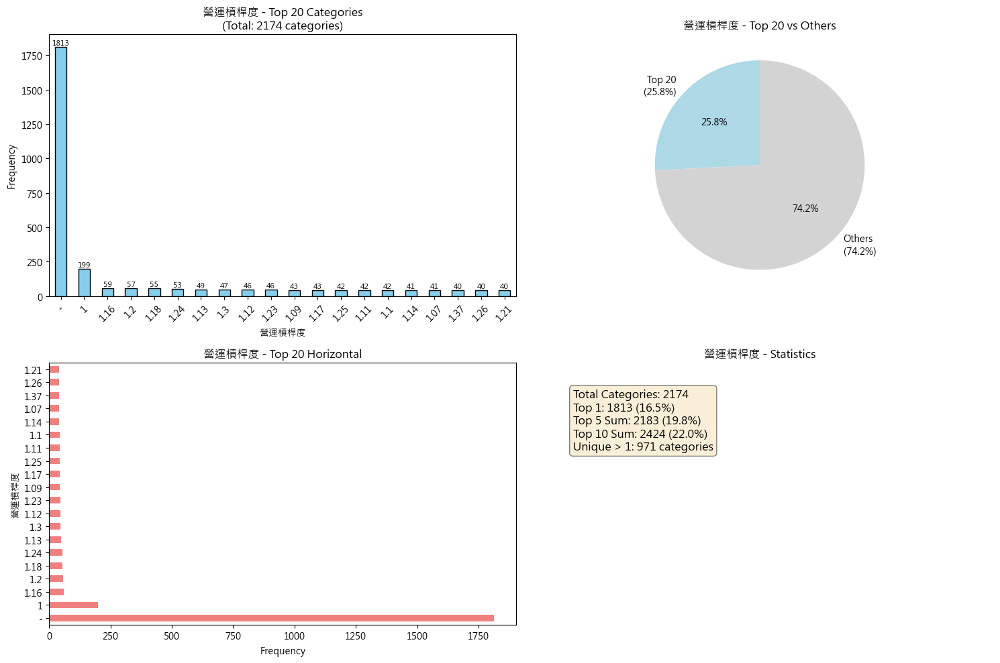


Detailed Statistics for 營運槓桿度:
  Most frequent value: '-' (count: 1813, 16.5%)
  Least frequent value: '17.92' (count: 1, 0.0%)
  Top 5 values cover: 19.8% of data
  Categories with count = 1: 1203

Variable 32: 利息保障倍數
Total unique values: 6887
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
利息保障倍數
-        680
6.4        9
6.13       9
2.91       9
4.14       8
4.74       8
3.82       8
2.59       8
1.5        8
0.02       8
2.18       7
10.58      7
13.85      7
2.15       7
12.91      7
Name: count, dtype: int64


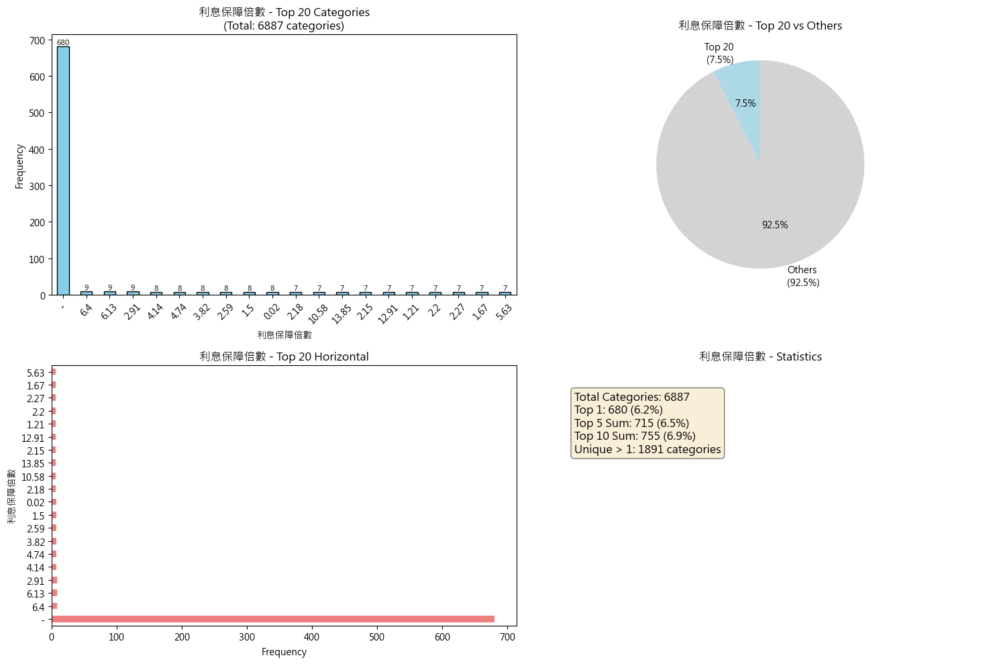


Detailed Statistics for 利息保障倍數:
  Most frequent value: '-' (count: 680, 6.2%)
  Least frequent value: '19.81' (count: 1, 0.0%)
  Top 5 values cover: 6.5% of data
  Categories with count = 1: 4996

Variable 33: ROA－綜合損益
Total unique values: 3073
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
ROA－綜合損益
-       101
2.41     17
4.62     17
0.64     16
0.6      16
1.29     15
0.73     15
2.92     15
5.05     15
0.69     15
3.34     14
0.95     14
2.91     14
3.57     14
1.73     14
Name: count, dtype: int64


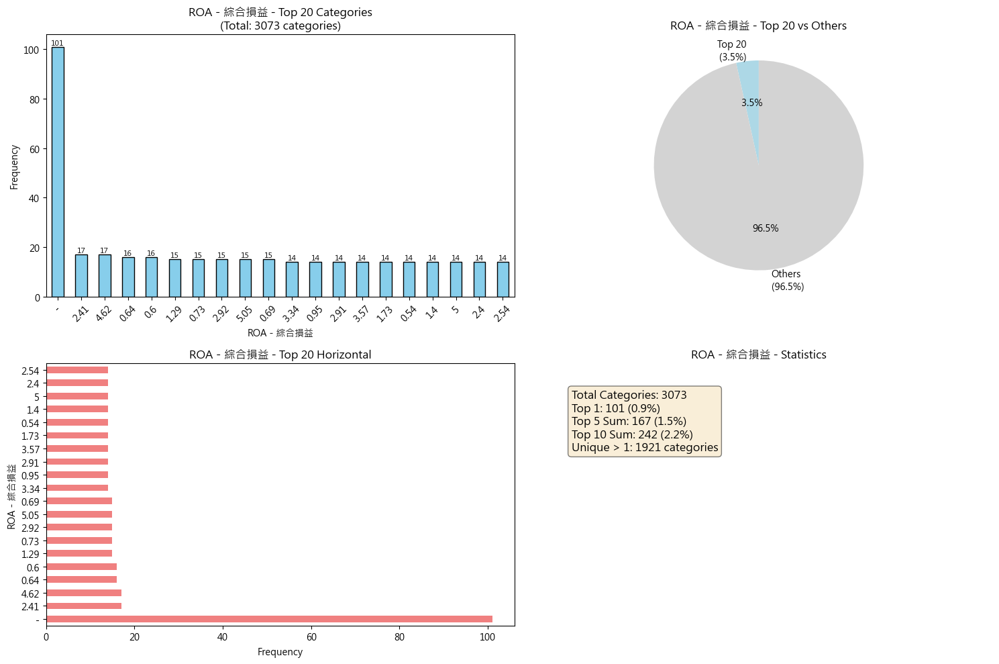


Detailed Statistics for ROA－綜合損益:
  Most frequent value: '-' (count: 101, 0.9%)
  Least frequent value: '-3.54' (count: 1, 0.0%)
  Top 5 values cover: 1.5% of data
  Categories with count = 1: 1152

Variable 34: ROE－綜合損益
Total unique values: 4404
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
ROE－綜合損益
-        101
7.55      13
0.12      12
6.48      11
4.93      11
8.21      11
11.26     11
3.07      11
3.43      10
6.35      10
11.43     10
3.39      10
4.5       10
8.97      10
11.72      9
Name: count, dtype: int64


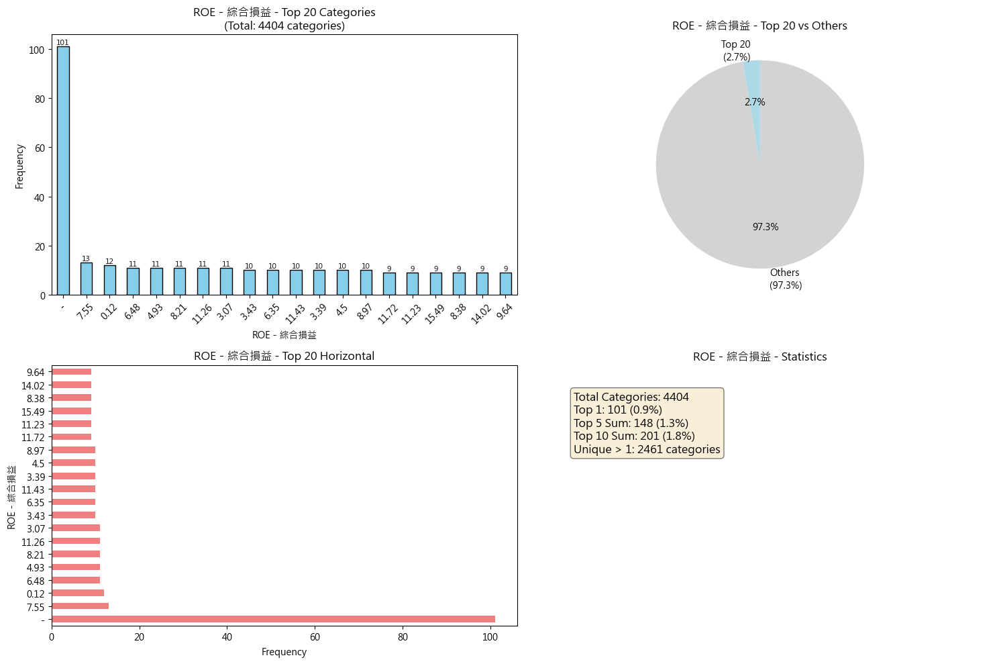


Detailed Statistics for ROE－綜合損益:
  Most frequent value: '-' (count: 101, 0.9%)
  Least frequent value: '-7.42' (count: 1, 0.0%)
  Top 5 values cover: 1.3% of data
  Categories with count = 1: 1943

Variable 35: 現金流量允當比
Total unique values: 8515
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
現金流量允當比
-         605
104.33      6
95.63       5
8.99        5
75.33       5
116.44      5
73.34       4
134.54      4
110.52      4
85.64       4
90.48       4
57.93       4
75.07       4
92.09       4
67.65       4
Name: count, dtype: int64


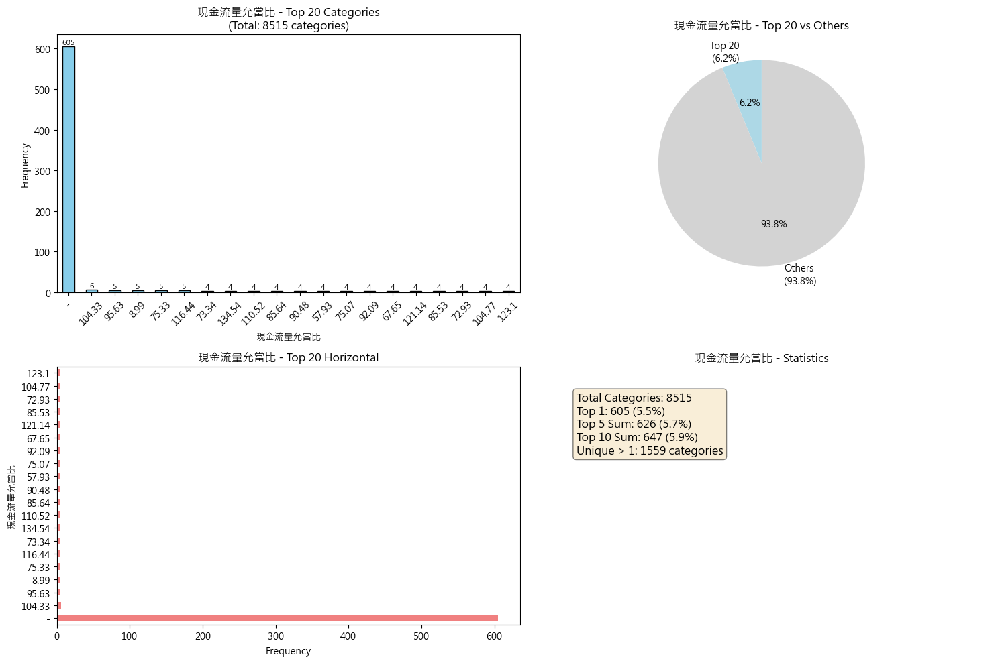


Detailed Statistics for 現金流量允當比:
  Most frequent value: '-' (count: 605, 5.5%)
  Least frequent value: '7.64' (count: 1, 0.0%)
  Top 5 values cover: 5.7% of data
  Categories with count = 1: 6956

Variable 36: 現金再投資比
Total unique values: 3618
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
現金再投資比
-       561
4.28     16
1.69     14
1.71     14
2.79     13
2.95     13
3.74     13
3.31     13
2.68     12
1.42     12
4.32     12
3.45     12
2.34     12
2.32     12
3.62     12
Name: count, dtype: int64


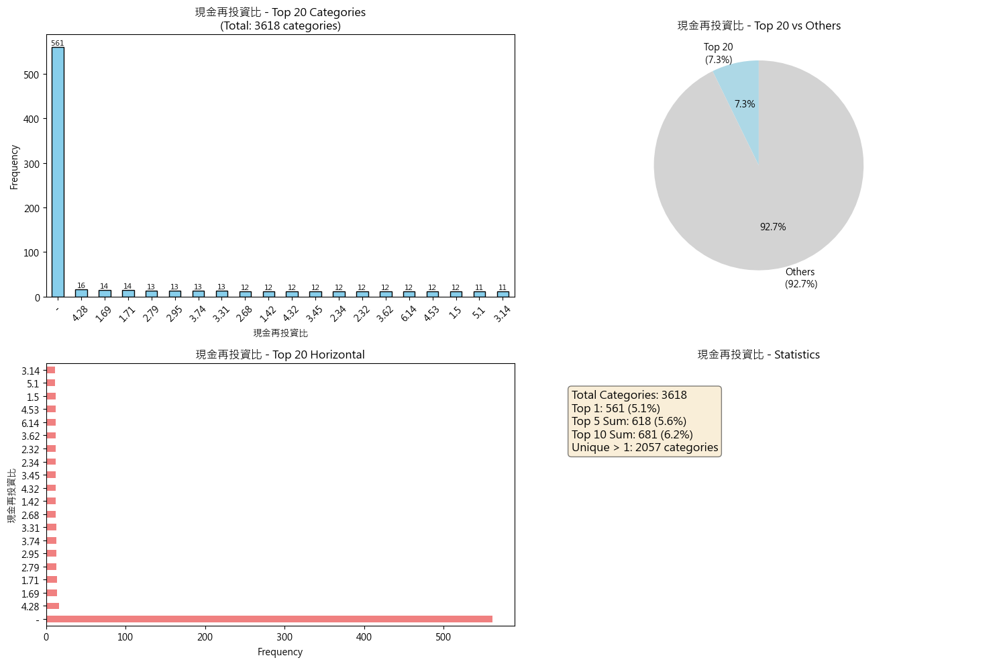


Detailed Statistics for 現金再投資比:
  Most frequent value: '-' (count: 561, 5.1%)
  Least frequent value: '-7.04' (count: 1, 0.0%)
  Top 5 values cover: 5.6% of data
  Categories with count = 1: 1561

Variable 37: 流動比率
Total unique values: 9119
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
流動比率
-         341
236.32      5
139.25      4
224.11      4
153.45      4
109.15      4
166.44      4
135.79      4
182.16      4
173.68      4
156.19      4
139.3       4
138.34      4
124.69      4
100.51      4
Name: count, dtype: int64


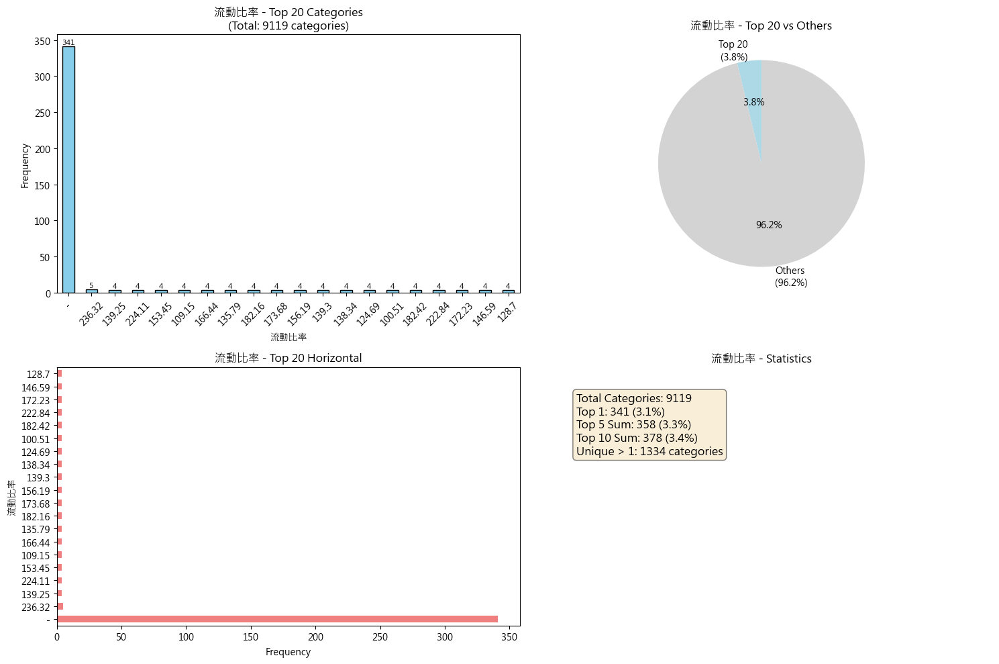


Detailed Statistics for 流動比率:
  Most frequent value: '-' (count: 341, 3.1%)
  Least frequent value: '149.48' (count: 1, 0.0%)
  Top 5 values cover: 3.3% of data
  Categories with count = 1: 7785

Variable 38: 速動比率
Total unique values: 9024
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
速動比率
-         342
82.36       6
93.85       5
67.19       5
96.19       5
129.72      4
80.67       4
92.66       4
93.99       4
116.02      4
114.1       4
93.39       4
126.61      4
91.49       4
134.92      4
Name: count, dtype: int64


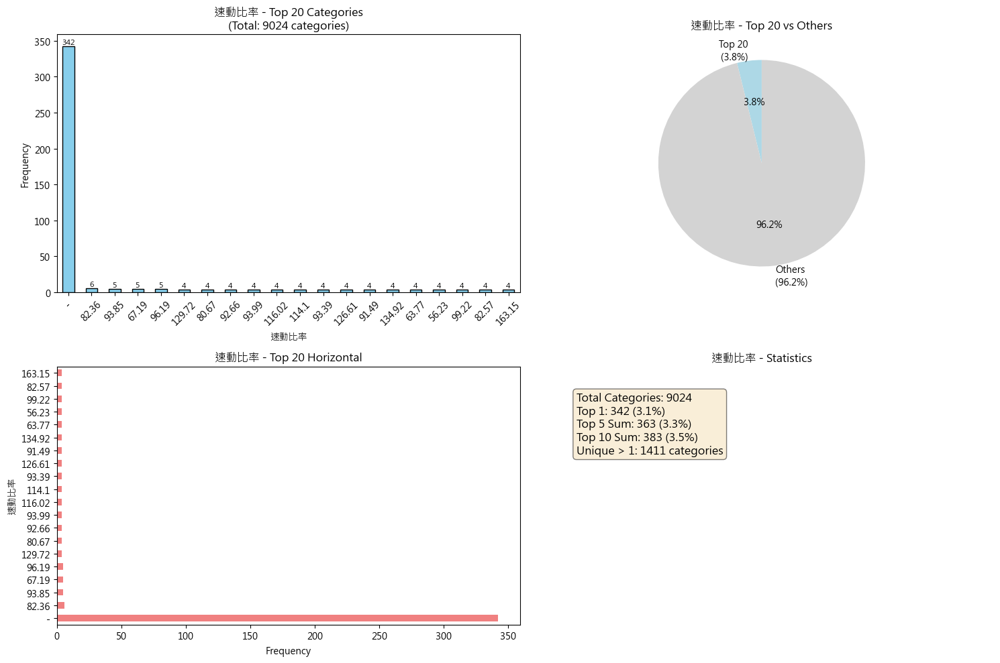


Detailed Statistics for 速動比率:
  Most frequent value: '-' (count: 342, 3.1%)
  Least frequent value: '46.61' (count: 1, 0.0%)
  Top 5 values cover: 3.3% of data
  Categories with count = 1: 7613

Variable 39: 利息支出率
Total unique values: 4634
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
利息支出率
0       398
-       218
0.01     60
0.02     49
0.03     41
0.05     38
0.06     33
0.04     33
0.16     32
0.07     30
0.13     29
0.1      29
0.14     29
0.2      29
0.12     28
Name: count, dtype: int64


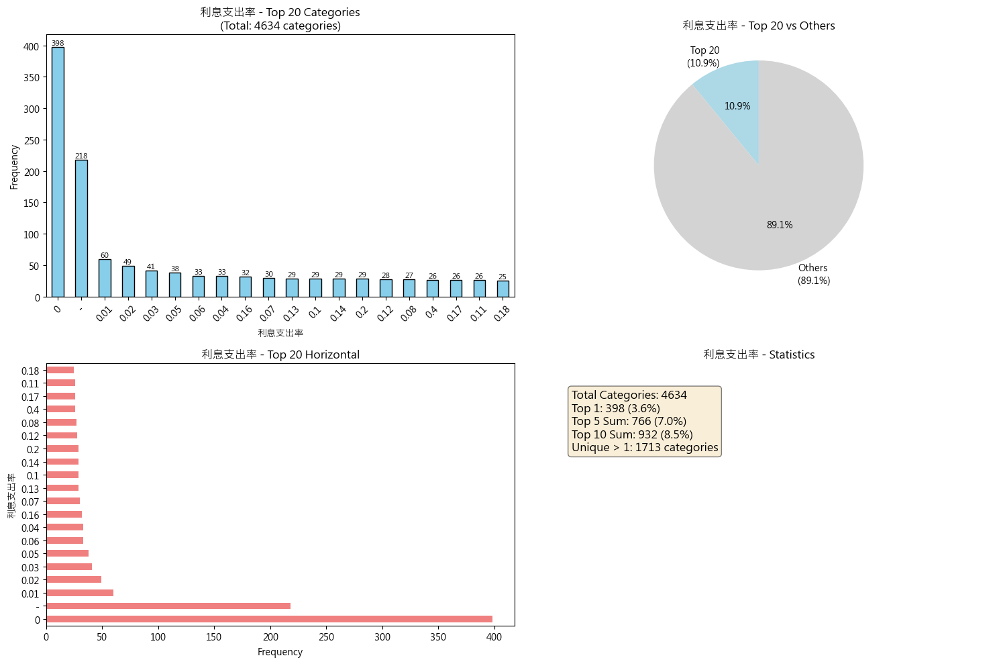


Detailed Statistics for 利息支出率:
  Most frequent value: '0' (count: 398, 3.6%)
  Least frequent value: '78.03' (count: 1, 0.0%)
  Top 5 values cover: 7.0% of data
  Categories with count = 1: 2921

Variable 40: 利息支出率(B)
Total unique values: 1022
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
利息支出率(B)
0       1027
-        384
0.01     304
0.02     196
0.03     171
0.04     164
0.06     152
0.12     132
0.05     125
0.09     121
0.07     119
0.1      119
0.15     116
0.13     114
0.14     109
Name: count, dtype: int64


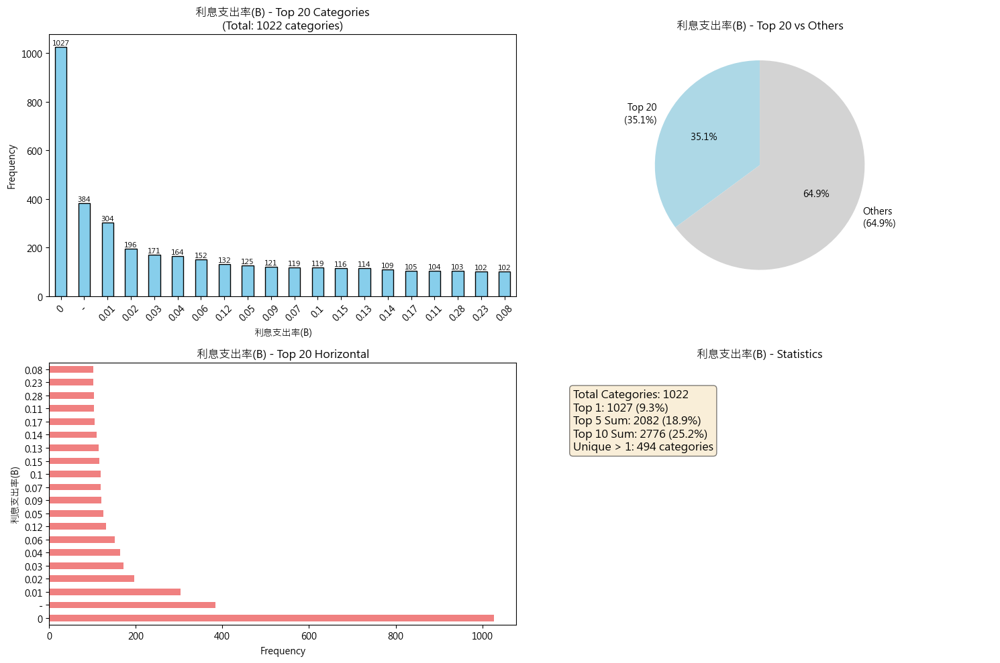


Detailed Statistics for 利息支出率(B):
  Most frequent value: '0' (count: 1027, 9.3%)
  Least frequent value: '7.31' (count: 1, 0.0%)
  Top 5 values cover: 18.9% of data
  Categories with count = 1: 528

Variable 41: 總負債/總淨值
Total unique values: 8638
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
總負債/總淨值
87.29    7
69.7     6
15.18    5
55.85    5
102.3    5
46.48    5
71.95    5
61.89    5
38.88    5
35.39    5
38.79    5
89.49    5
46.19    4
46.85    4
61.64    4
Name: count, dtype: int64


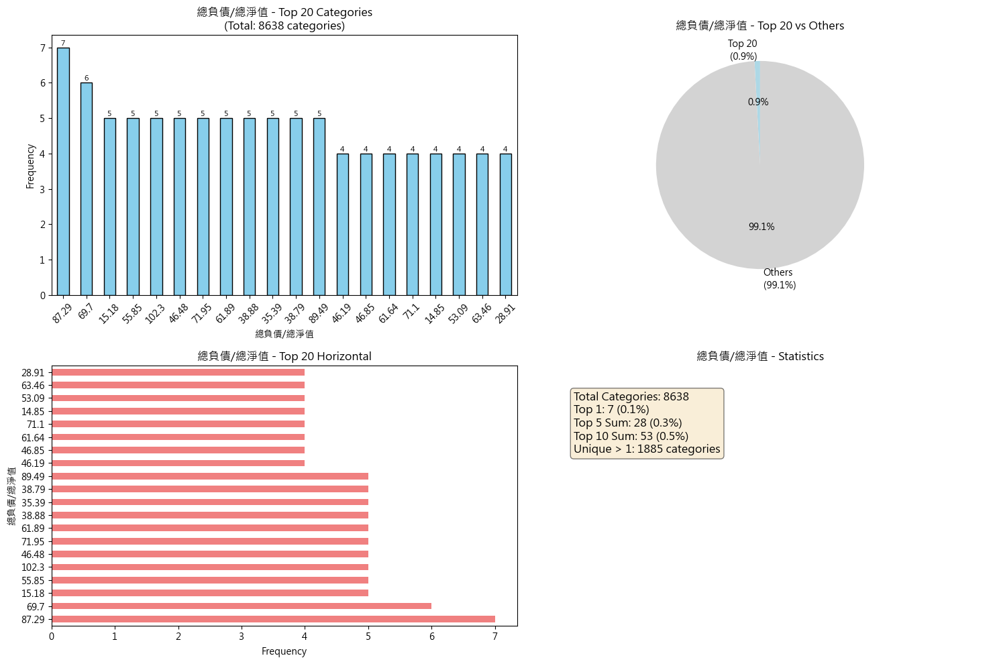


Detailed Statistics for 總負債/總淨值:
  Most frequent value: '87.29' (count: 7, 0.1%)
  Least frequent value: '166.51' (count: 1, 0.0%)
  Top 5 values cover: 0.3% of data
  Categories with count = 1: 6753

Variable 42: 長期資金適合率(A)
Total unique values: 9847
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
長期資金適合率(A)
-         344
171.24      5
191.16      4
176.6       4
159.16      4
183.18      4
214.66      3
182.11      3
196.08      3
230.46      3
131.02      3
319.53      3
154.22      3
183.21      3
249.5       3
Name: count, dtype: int64


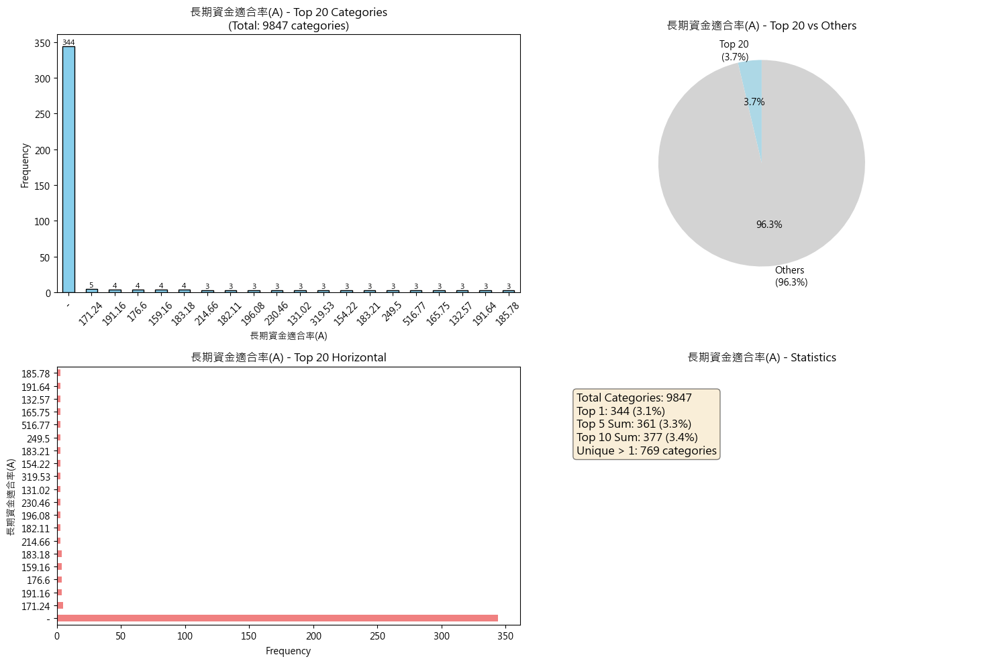


Detailed Statistics for 長期資金適合率(A):
  Most frequent value: '-' (count: 344, 3.1%)
  Least frequent value: '140.95' (count: 1, 0.0%)
  Top 5 values cover: 3.3% of data
  Categories with count = 1: 9078

Variable 43: 長短期借款
Total unique values: 9141
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
長短期借款
0          1440
100,000      29
50,000       24
200,000      24
35,000       14
150,000      14
30,000       14
60,000       13
40,000       13
20,000       11
500,000      10
300,000      10
600,000       9
220,000       8
450,000       8
Name: count, dtype: int64


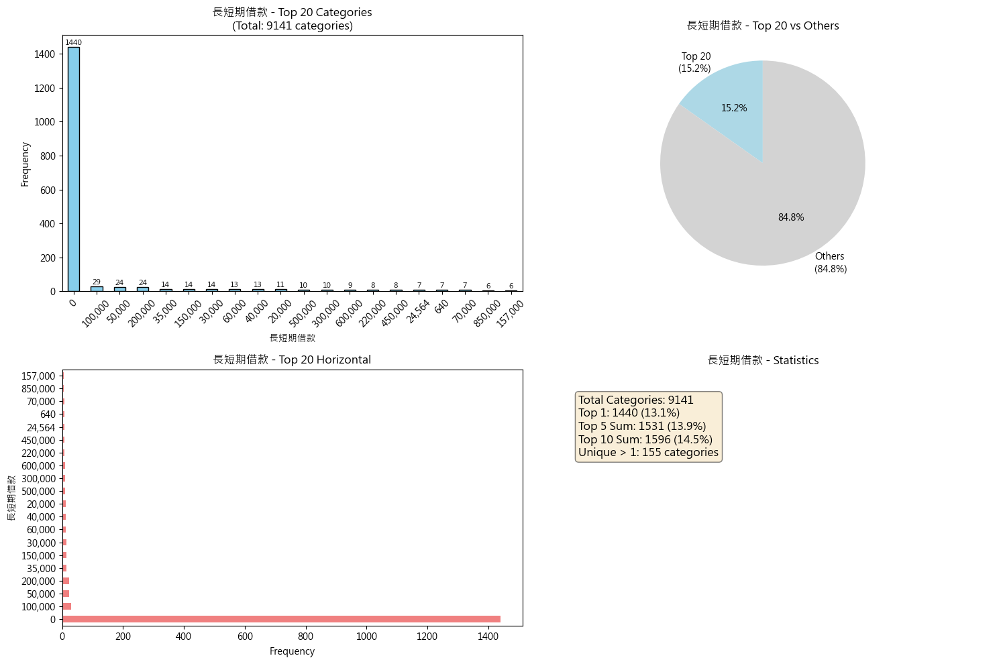


Detailed Statistics for 長短期借款:
  Most frequent value: '0' (count: 1440, 13.1%)
  Least frequent value: '9,154,078' (count: 1, 0.0%)
  Top 5 values cover: 13.9% of data
  Categories with count = 1: 8986

Variable 44: 淨負債
Total unique values: 10630
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
淨負債
-             375
690,216         2
327,430         2
817,483         2
371,173         2
292,281         2
3,150,635       2
-847,048        2
-274,507        2
-162,647        2
-81,429         2
787,422         1
-140,372        1
536,787         1
86,938,867      1
Name: count, dtype: int64


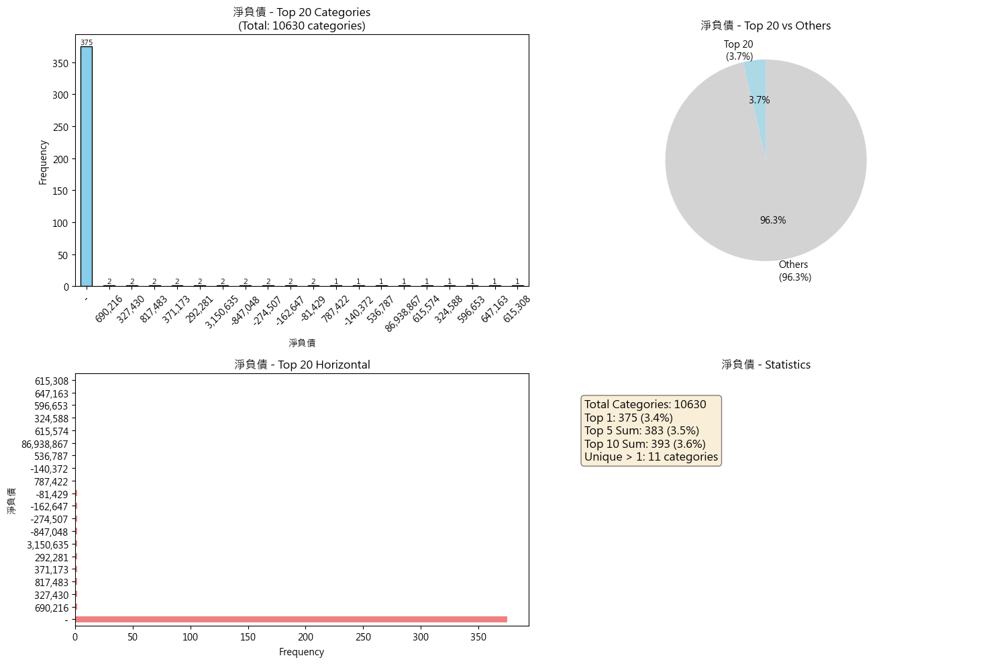


Detailed Statistics for 淨負債:
  Most frequent value: '-' (count: 375, 3.4%)
  Least frequent value: '6,797,863' (count: 1, 0.0%)
  Top 5 values cover: 3.5% of data
  Categories with count = 1: 10619

Variable 45: 借款依存度
Total unique values: 6505
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
借款依存度
0        1378
-         342
0.01       10
0.09        9
0.17        7
3.44        7
0.67        7
19.89       7
0.53        6
0.02        6
26.64       6
0.06        6
0.28        6
0.07        6
0.05        6
Name: count, dtype: int64


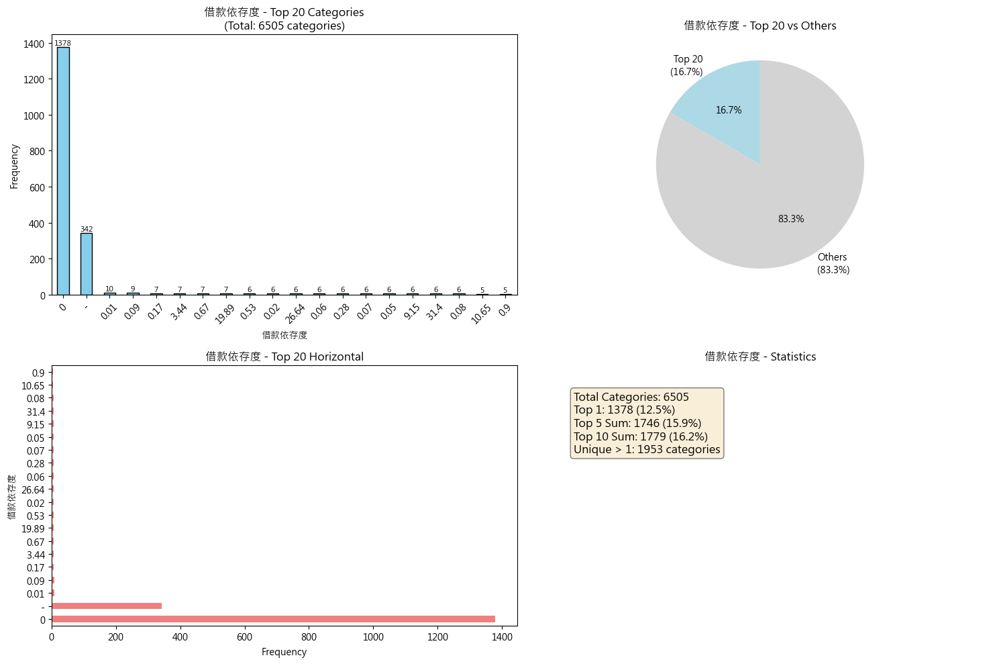


Detailed Statistics for 借款依存度:
  Most frequent value: '0' (count: 1378, 12.5%)
  Least frequent value: '101.7' (count: 1, 0.0%)
  Top 5 values cover: 15.9% of data
  Categories with count = 1: 4552

Variable 46: 或有負債/淨值
Total unique values: 466
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
或有負債/淨值
0       9987
-        371
0.02      13
0.01       8
0.3        7
0.08       6
0.26       6
0.5        6
0.34       5
0.13       5
0.23       4
0.17       4
0.4        4
0.28       4
0.39       4
Name: count, dtype: int64


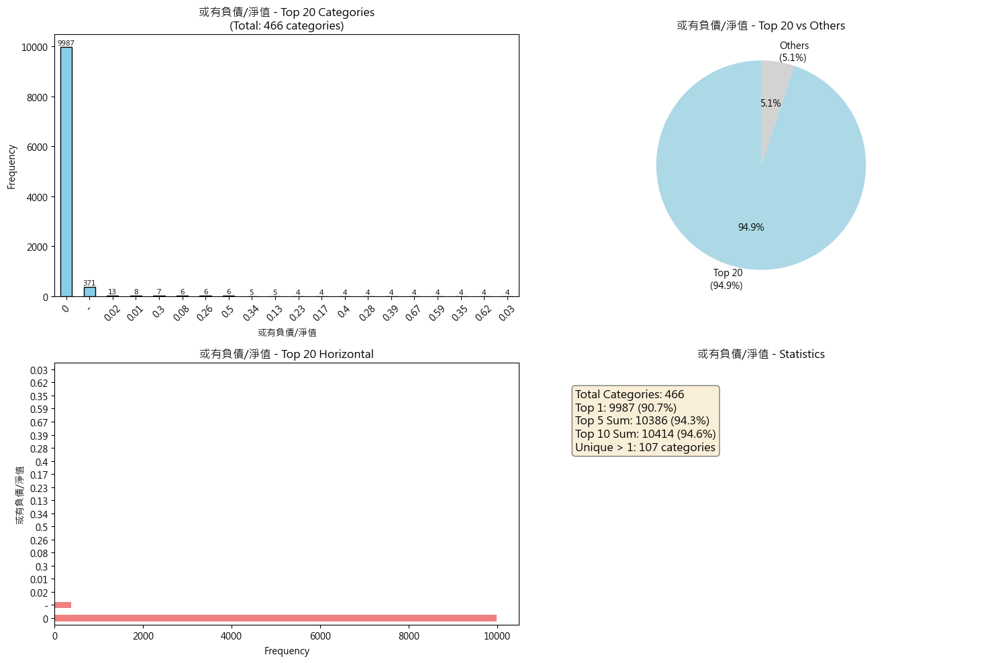


Detailed Statistics for 或有負債/淨值:
  Most frequent value: '0' (count: 9987, 90.7%)
  Least frequent value: '20.38' (count: 1, 0.0%)
  Top 5 values cover: 94.3% of data
  Categories with count = 1: 359

Variable 47: 營業利益 /實收資本比
Total unique values: 7207
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
營業利益 /實收資本比
-        295
12.5       7
4.36       7
1.06       7
0.56       6
10.32      6
1.98       6
0.76       6
2.11       6
18.29      6
3.44       6
4.75       6
8.65       6
0.97       6
8.49       6
Name: count, dtype: int64


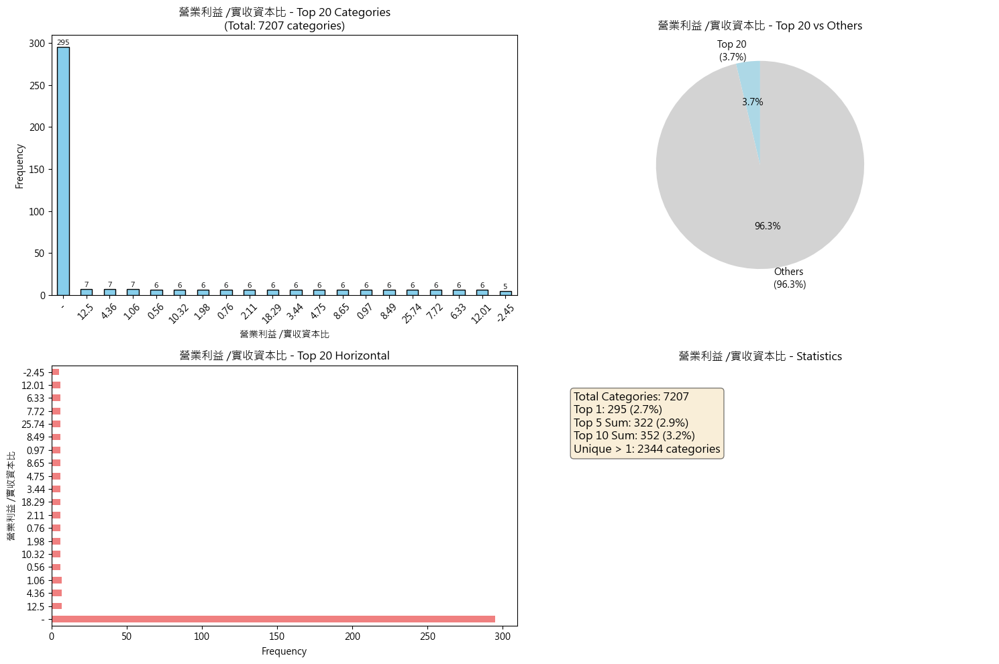


Detailed Statistics for 營業利益 /實收資本比:
  Most frequent value: '-' (count: 295, 2.7%)
  Least frequent value: '115.66' (count: 1, 0.0%)
  Top 5 values cover: 2.9% of data
  Categories with count = 1: 4863

Variable 48: 稅前純益 /實收資本
Total unique values: 7477
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
稅前純益 /實收資本
-        20
-2.85     7
27.91     7
13.15     7
24.12     6
9.56      6
2.88      6
25.76     6
5.18      6
16.95     6
14.91     6
13.25     6
17.83     6
23.02     6
18.5      6
Name: count, dtype: int64


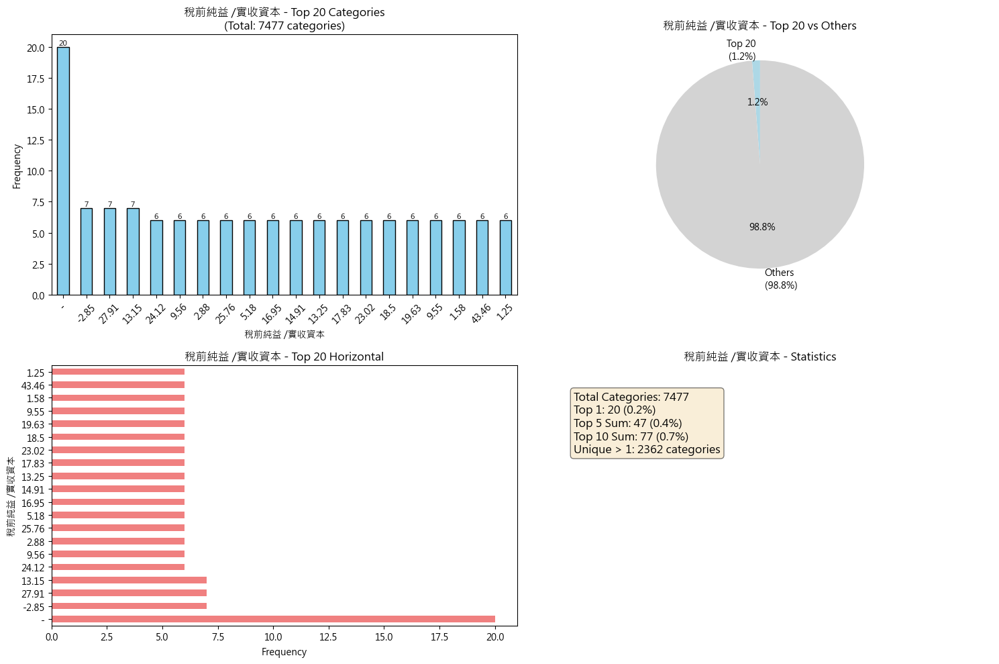


Detailed Statistics for 稅前純益 /實收資本:
  Most frequent value: '-' (count: 20, 0.2%)
  Least frequent value: '82.64' (count: 1, 0.0%)
  Top 5 values cover: 0.4% of data
  Categories with count = 1: 5115

Variable 49: 內部保留比率
Total unique values: 5476
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
內部保留比率
-        1783
100       994
10         26
40.16       8
0           8
10.46       8
17.75       8
27.49       7
19.67       6
50.19       6
15.14       6
40          5
51.18       5
54.26       5
10.2        5
Name: count, dtype: int64


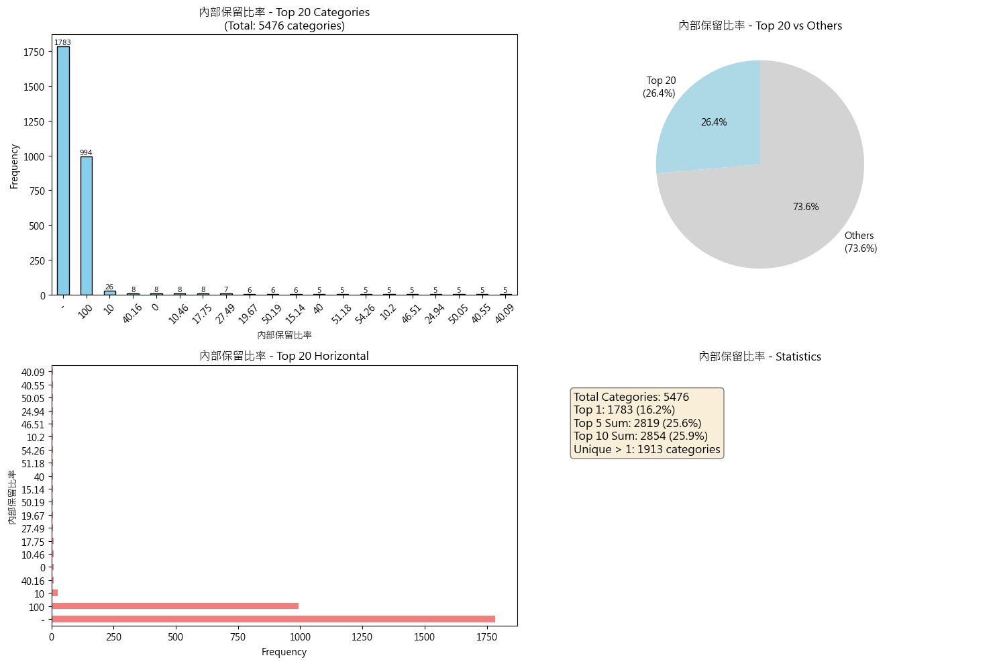


Detailed Statistics for 內部保留比率:
  Most frequent value: '-' (count: 1783, 16.2%)
  Least frequent value: '68.43' (count: 1, 0.0%)
  Top 5 values cover: 25.6% of data
  Categories with count = 1: 3563

Variable 50: 股利支付率
Total unique values: 5555
Total non-null values: 11014
Missing values: 0

Top 15 most frequent values:
股利支付率
0        2494
-         218
90         27
89.54       8
59.84       8
82.25       8
100         8
60          7
72.51       7
49.95       6
74.86       6
84.86       6
80.33       6
49.81       6
73.26       5
Name: count, dtype: int64


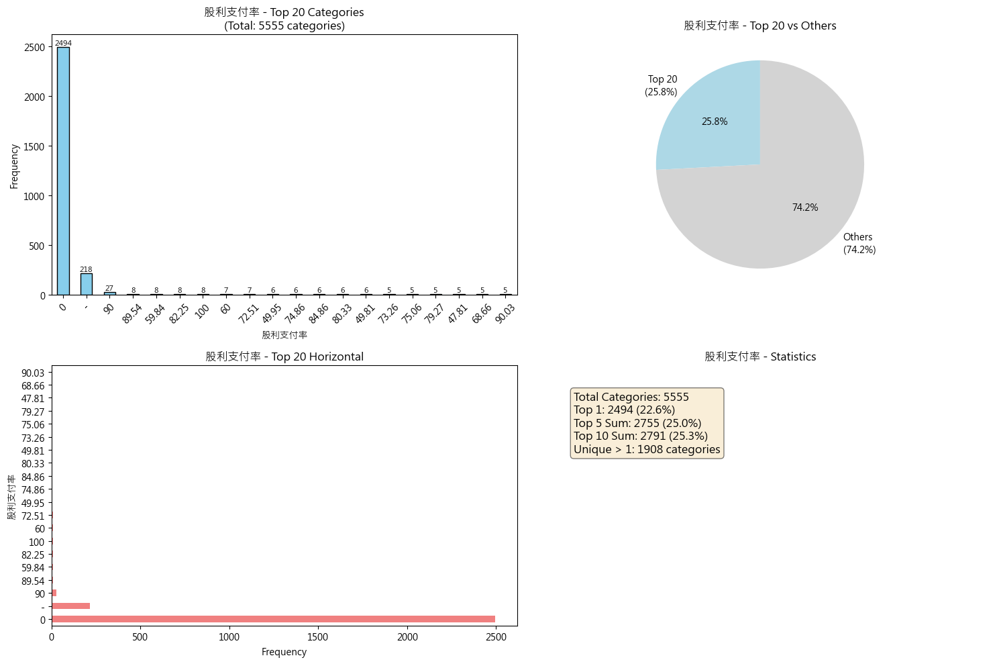


Detailed Statistics for 股利支付率:
  Most frequent value: '0' (count: 2494, 22.6%)
  Least frequent value: '31.57' (count: 1, 0.0%)
  Top 5 values cover: 25.0% of data
  Categories with count = 1: 3647

Variable 51: tcri
Total unique values: 7
Total non-null values: 6624
Missing values: 4390

Top 15 most frequent values:
tcri
6    2161
5    2054
7    1389
8     667
9     292
D      59
C       2
Name: count, dtype: int64


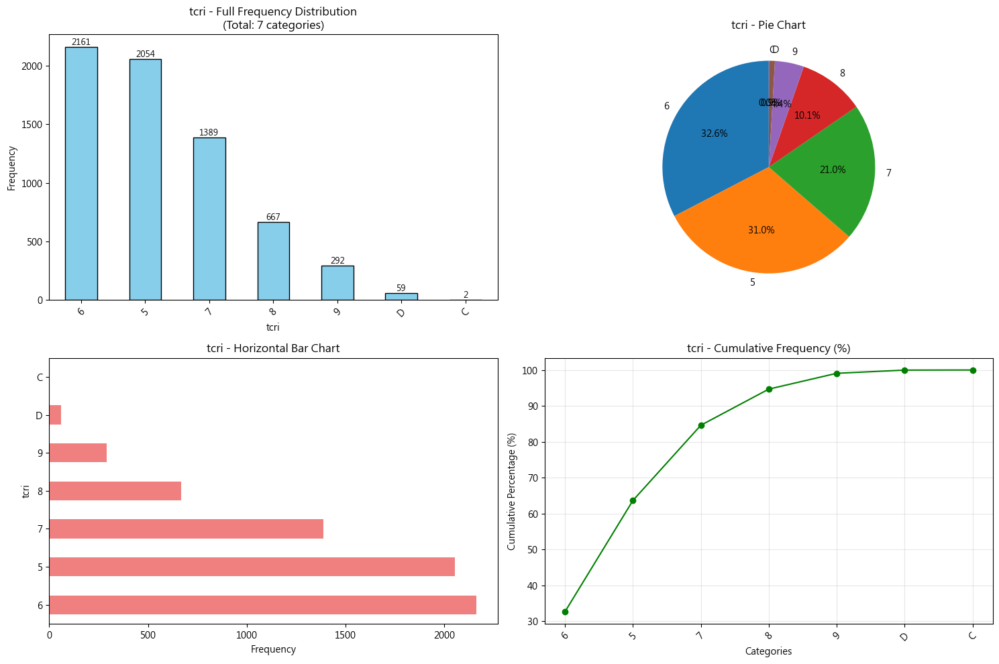


Detailed Statistics for tcri:
  Most frequent value: '6' (count: 2161, 32.6%)
  Least frequent value: 'C' (count: 2, 0.0%)
  Top 5 values cover: 99.1% of data
  Categories with count = 1: 0

CATEGORICAL VARIABLES ANALYSIS COMPLETED


In [18]:
print("\n" + "="*50)
print("3. CATEGORICAL VARIABLES FREQUENCY - COMPLETE VISUALIZATION")
print("="*50)

# 獲取所有類別型變數
categorical_vars = merged_data.select_dtypes(include=['object']).columns.tolist()

if categorical_vars:
    print(f"Found {len(categorical_vars)} categorical variables:")
    print(categorical_vars)
    
    # 為每個類別變數創建頻率圖表
    for i, col in enumerate(categorical_vars):
        print(f"\n{'='*30}")
        print(f"Variable {i+1}: {col}")
        print(f"{'='*30}")
        
        # 計算頻率
        freq = merged_data[col].value_counts()
        total_unique = len(freq)
        
        print(f"Total unique values: {total_unique}")
        print(f"Total non-null values: {merged_data[col].notna().sum()}")
        print(f"Missing values: {merged_data[col].isna().sum()}")
        
        # 顯示前15個最頻繁的值
        print(f"\nTop 15 most frequent values:")
        print(freq.head(15))
        
        # 創建圖表
        plt.figure(figsize=(15, 10))
        
        if total_unique <= 15:
            # 如果類別數少於等於15，顯示完整條形圖
            plt.subplot(2, 2, 1)
            bars = freq.plot(kind='bar', color='skyblue', edgecolor='black')
            plt.title(f'{col} - Full Frequency Distribution\n(Total: {total_unique} categories)')
            plt.xlabel(col)
            plt.ylabel('Frequency')
            plt.xticks(rotation=45)
            
            # 在條形上添加數值標籤
            for idx, value in enumerate(freq):
                plt.text(idx, value, str(value), ha='center', va='bottom', fontsize=9)
            
            # 餅圖
            plt.subplot(2, 2, 2)
            # 只顯示前10個，其他歸為"Other"
            if total_unique > 10:
                top_10 = freq.head(10)
                other_sum = freq[10:].sum()
                pie_data = pd.concat([top_10, pd.Series([other_sum], index=['Other'])])
                plt.pie(pie_data, labels=pie_data.index, autopct='%1.1f%%', startangle=90)
                plt.title(f'{col} - Pie Chart (Top 10 + Other)')
            else:
                plt.pie(freq, labels=freq.index, autopct='%1.1f%%', startangle=90)
                plt.title(f'{col} - Pie Chart')
            
            # 水平條形圖
            plt.subplot(2, 2, 3)
            freq.plot(kind='barh', color='lightcoral')
            plt.title(f'{col} - Horizontal Bar Chart')
            plt.xlabel('Frequency')
            plt.ylabel(col)
            
            # 累積頻率圖
            plt.subplot(2, 2, 4)
            cumulative_freq = freq.cumsum() / freq.sum() * 100
            cumulative_freq.plot(kind='line', marker='o', color='green')
            plt.title(f'{col} - Cumulative Frequency (%)')
            plt.xlabel('Categories')
            plt.ylabel('Cumulative Percentage (%)')
            plt.grid(True, alpha=0.3)
            plt.xticks(rotation=45)
            
        else:
            # 如果類別數很多，只顯示前20個
            top_20 = freq.head(20)
            plt.subplot(2, 2, 1)
            bars = top_20.plot(kind='bar', color='skyblue', edgecolor='black')
            plt.title(f'{col} - Top 20 Categories\n(Total: {total_unique} categories)')
            plt.xlabel(col)
            plt.ylabel('Frequency')
            plt.xticks(rotation=45)
            
            # 在條形上添加數值標籤
            for idx, value in enumerate(top_20):
                plt.text(idx, value, str(value), ha='center', va='bottom', fontsize=8)
            
            # 顯示前20個佔總體的比例
            plt.subplot(2, 2, 2)
            top_20_percentage = (top_20.sum() / freq.sum()) * 100
            others_percentage = 100 - top_20_percentage
            
            pie_data = pd.Series([top_20_percentage, others_percentage], 
                               index=[f'Top 20\n({top_20_percentage:.1f}%)', 
                                      f'Others\n({others_percentage:.1f}%)'])
            plt.pie(pie_data, labels=pie_data.index, autopct='%1.1f%%', startangle=90,
                   colors=['lightblue', 'lightgray'])
            plt.title(f'{col} - Top 20 vs Others')
            
            # 前20個的水平條形圖
            plt.subplot(2, 2, 3)
            top_20.plot(kind='barh', color='lightcoral')
            plt.title(f'{col} - Top 20 Horizontal')
            plt.xlabel('Frequency')
            plt.ylabel(col)
            
            # 類別數量統計
            plt.subplot(2, 2, 4)
            value_counts_info = [
                f'Total Categories: {total_unique}',
                f'Top 1: {freq.iloc[0]} ({freq.iloc[0]/freq.sum()*100:.1f}%)',
                f'Top 5 Sum: {freq.head(5).sum()} ({freq.head(5).sum()/freq.sum()*100:.1f}%)',
                f'Top 10 Sum: {freq.head(10).sum()} ({freq.head(10).sum()/freq.sum()*100:.1f}%)',
                f'Unique > 1: {(freq > 1).sum()} categories'
            ]
            
            plt.text(0.1, 0.9, '\n'.join(value_counts_info), 
                    fontsize=12, verticalalignment='top',
                    bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
            plt.xlim(0, 1)
            plt.ylim(0, 1)
            plt.axis('off')
            plt.title(f'{col} - Statistics')
        
        plt.tight_layout()
        plt.show()
        
        # 顯示該變數的詳細統計
        print(f"\nDetailed Statistics for {col}:")
        print(f"  Most frequent value: '{freq.index[0]}' (count: {freq.iloc[0]}, {freq.iloc[0]/freq.sum()*100:.1f}%)")
        print(f"  Least frequent value: '{freq.index[-1]}' (count: {freq.iloc[-1]}, {freq.iloc[-1]/freq.sum()*100:.1f}%)")
        print(f"  Top 5 values cover: {freq.head(5).sum()/freq.sum()*100:.1f}% of data")
        print(f"  Categories with count = 1: {(freq == 1).sum()}")
        
else:
    print("No categorical variables found in the dataset.")

print(f"\n{'='*50}")
print("CATEGORICAL VARIABLES ANALYSIS COMPLETED")
print(f"{'='*50}")


COMPARATIVE ANALYSIS OF ALL CATEGORICAL VARIABLES


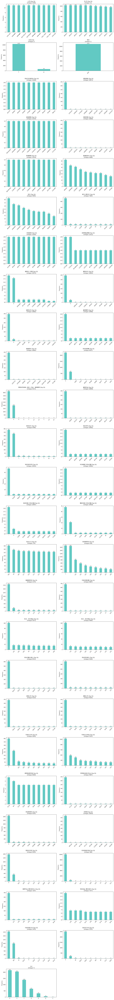


Summary Table of All Categorical Variables:
           Variable  Unique_Values  Missing_Values Most_Frequent  Most_Freq_Count Most_Freq_Pct Top3_Coverage
                 公司           1030               0       1101 台泥               11          0.1%          0.3%
                年/月             11               0       2024/12             1029          9.3%         28.0%
            合併(Y/N)              2               0             Y            10378         94.2%        100.0%
                 幣別              1               0           NTD            11014        100.0%        100.0%
            現金及約當現金          11000               0       101,579                2          0.0%          0.1%
               流動資產          10672               0             -              341          3.1%          3.1%
               資產總額          11014               0   593,413,647                1          0.0%          0.0%
               流動負債          10668               0             -           

In [19]:
# 額外：所有類別變數的綜合比較圖
if categorical_vars and len(categorical_vars) > 1:
    print(f"\n{'='*50}")
    print("COMPARATIVE ANALYSIS OF ALL CATEGORICAL VARIABLES")
    print(f"{'='*50}")
    
    # 創建綜合比較圖
    n_vars = len(categorical_vars)
    n_cols = 2
    n_rows = (n_vars + n_cols - 1) // n_cols
    
    plt.figure(figsize=(15, 5 * n_rows))
    
    for i, col in enumerate(categorical_vars):
        plt.subplot(n_rows, n_cols, i + 1)
        freq = merged_data[col].value_counts()
        
        # 只顯示前10個（如果類別太多）
        if len(freq) > 10:
            plot_data = freq.head(10)
            title_suffix = " (Top 10)"
        else:
            plot_data = freq
            title_suffix = ""
        
        plot_data.plot(kind='bar', color='lightseagreen', alpha=0.7)
        plt.title(f'{col}{title_suffix}\n(Unique: {len(freq)})')
        plt.xlabel('')
        plt.ylabel('Frequency')
        plt.xticks(rotation=45)
        
        # 添加數值標籤
        for idx, value in enumerate(plot_data):
            plt.text(idx, value, str(value), ha='center', va='bottom', fontsize=8)
    
    plt.tight_layout()
    plt.show()
    
    # 顯示所有類別變數的摘要表格
    print("\nSummary Table of All Categorical Variables:")
    summary_data = []
    for col in categorical_vars:
        freq = merged_data[col].value_counts()
        summary_data.append({
            'Variable': col,
            'Unique_Values': len(freq),
            'Missing_Values': merged_data[col].isna().sum(),
            'Most_Frequent': freq.index[0],
            'Most_Freq_Count': freq.iloc[0],
            'Most_Freq_Pct': f"{freq.iloc[0]/len(merged_data)*100:.1f}%",
            'Top3_Coverage': f"{freq.head(3).sum()/len(merged_data)*100:.1f}%"
        })
    
    summary_df = pd.DataFrame(summary_data)
    print(summary_df.to_string(index=False))